In [1]:
# %pip install nbformat
# %pip install scikit-learn

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.impute import KNNImputer
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler, RobustScaler
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_absolute_error



# 🎯 Objectifs :
> Ce notebook a pour objectif de montrer toutes les recherches, idées et décision prises avant d'aboutir à la version finale "projet_classification_cirrhosis_modele.ipynb".
> Il n'est pas necessaire de lancer les cellules, ce notebook appuie simplement les differentes idées et recherches effectuées tout le long du projet.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             15000 non-null  int64  
 1   N_Days         15000 non-null  float64
 2   Drug           8564 non-null   object 
 3   Age            15000 non-null  float64
 4   Sex            15000 non-null  object 
 5   Ascites        8563 non-null   object 
 6   Hepatomegaly   8564 non-null   object 
 7   Spiders        8555 non-null   object 
 8   Edema          15000 non-null  object 
 9   Bilirubin      15000 non-null  float64
 10  Cholesterol    6669 non-null   float64
 11  Albumin        15000 non-null  float64
 12  Copper         8452 non-null   float64
 13  Alk_Phos       8558 non-null   float64
 14  SGOT           8555 non-null   float64
 15  Tryglicerides  6630 non-null   float64
 16  Platelets      14414 non-null  float64
 17  Prothrombin    14974 non-null  float64
 18  Stage 

/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_4098/3677733665.py:2: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[ 2990.    133.3   133.3 13727.  17874. ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  train_df.loc[train_df['N_Days'] > train_df['Age'], 'N_Days'] = train_df['Age']
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_4098/3371030689.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=train_df, palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_4098/3371030689.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect

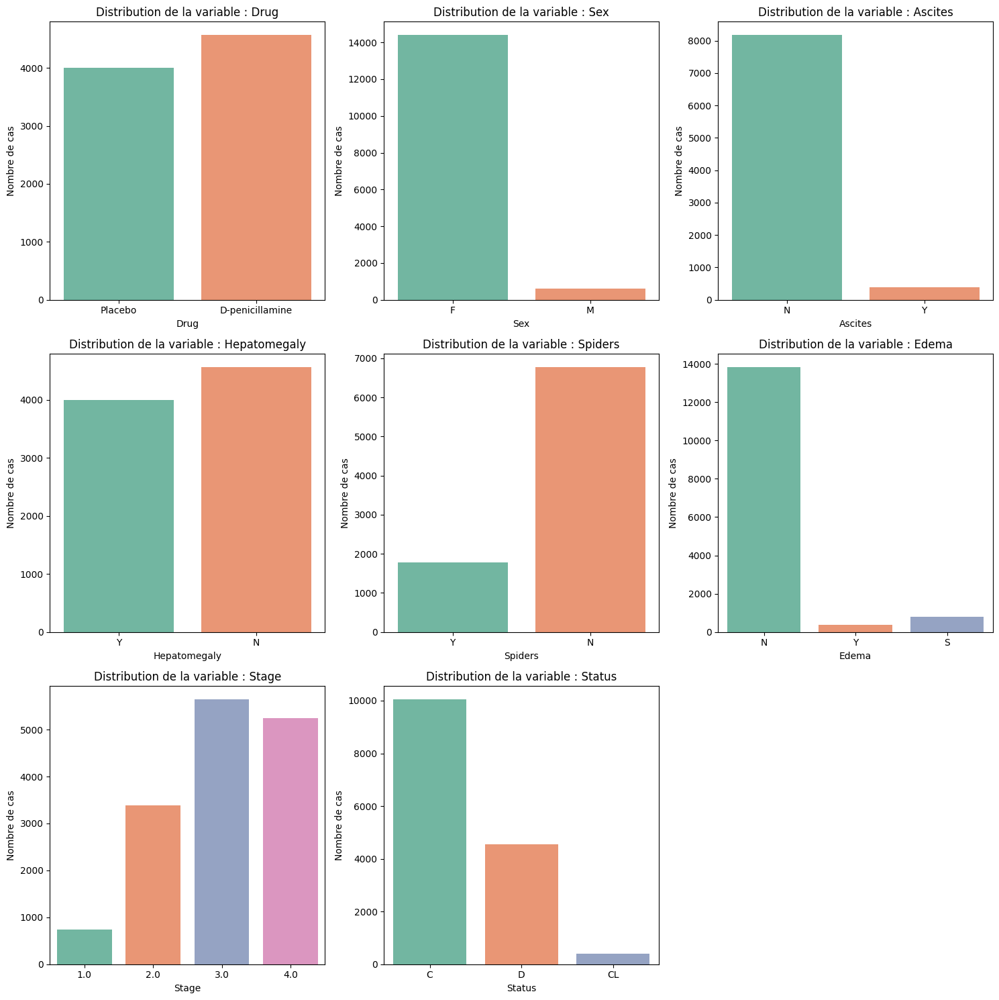

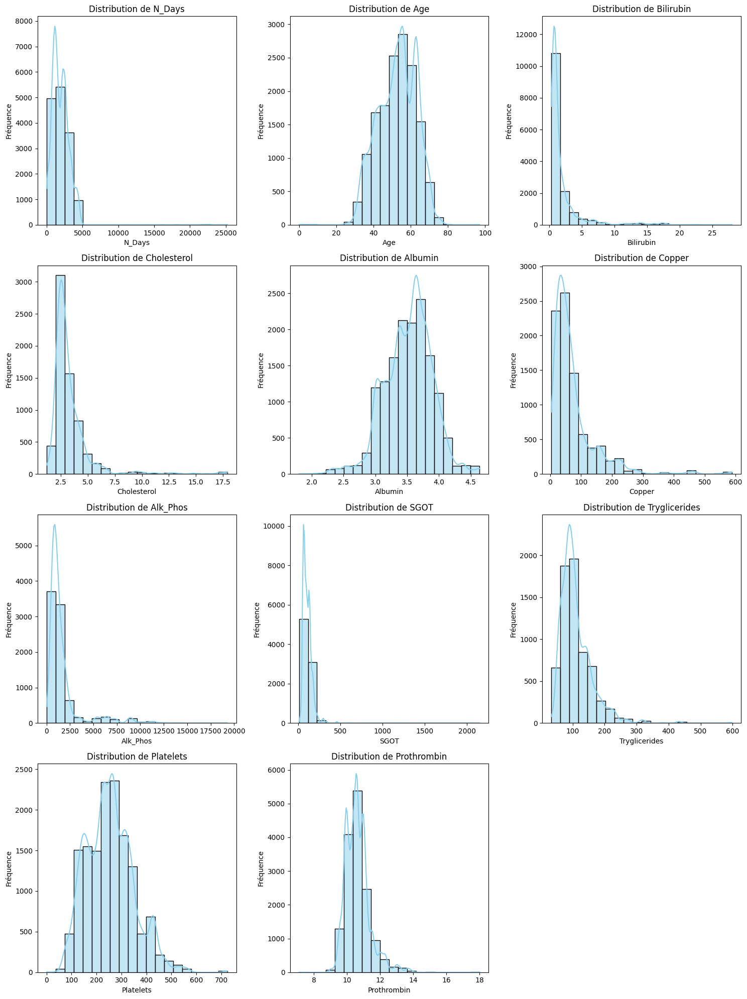

/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_4098/350439153.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=train_df[col], palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_4098/350439153.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=train_df[col], palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_4098/350439153.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=train_df[col], palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_4098/350439

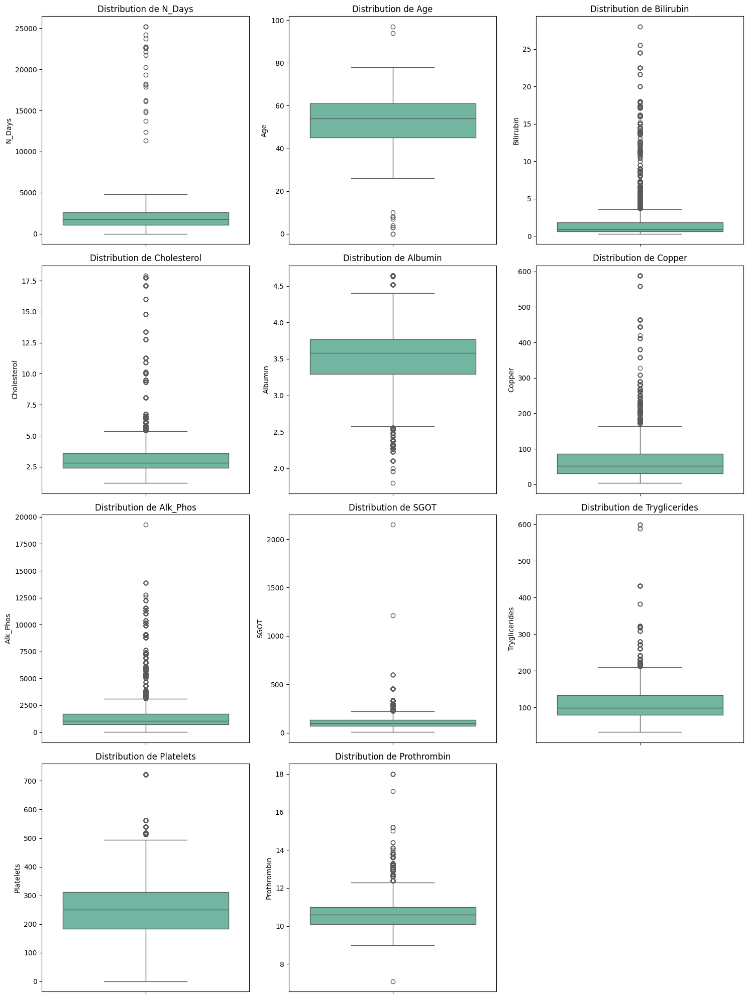

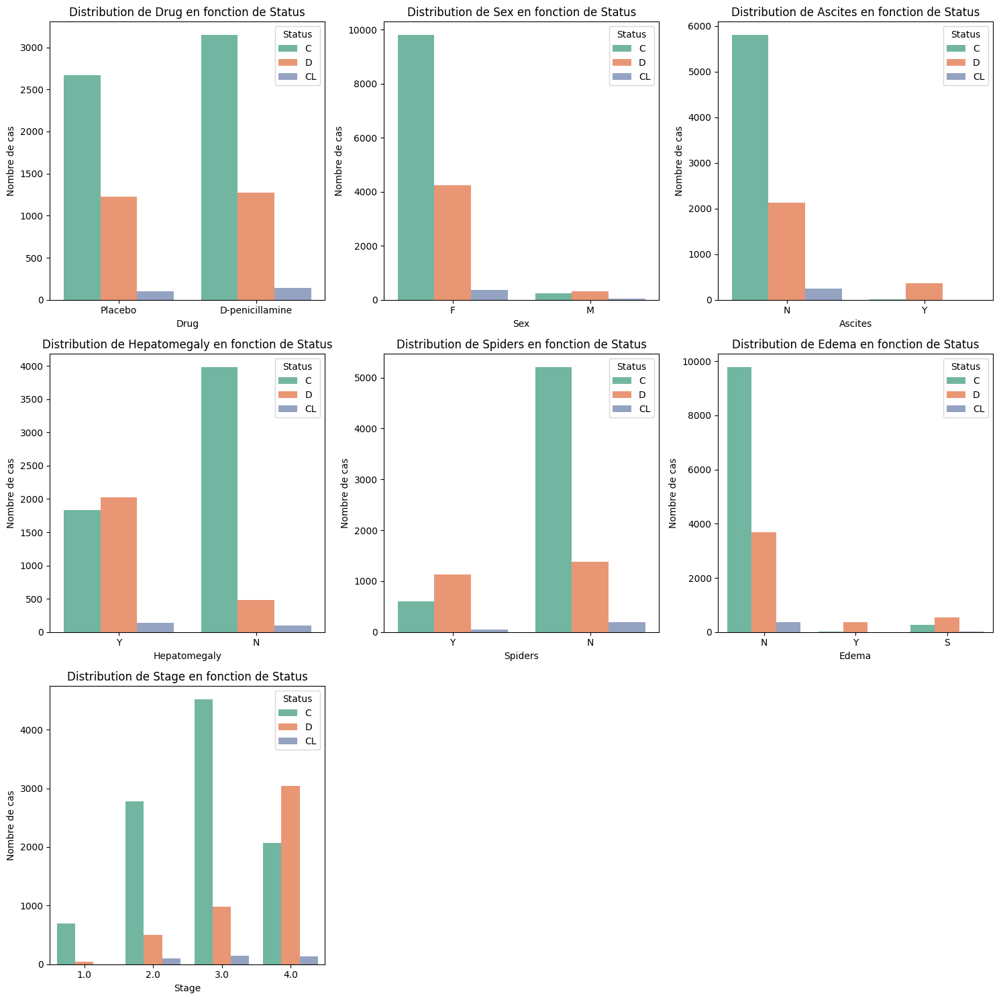

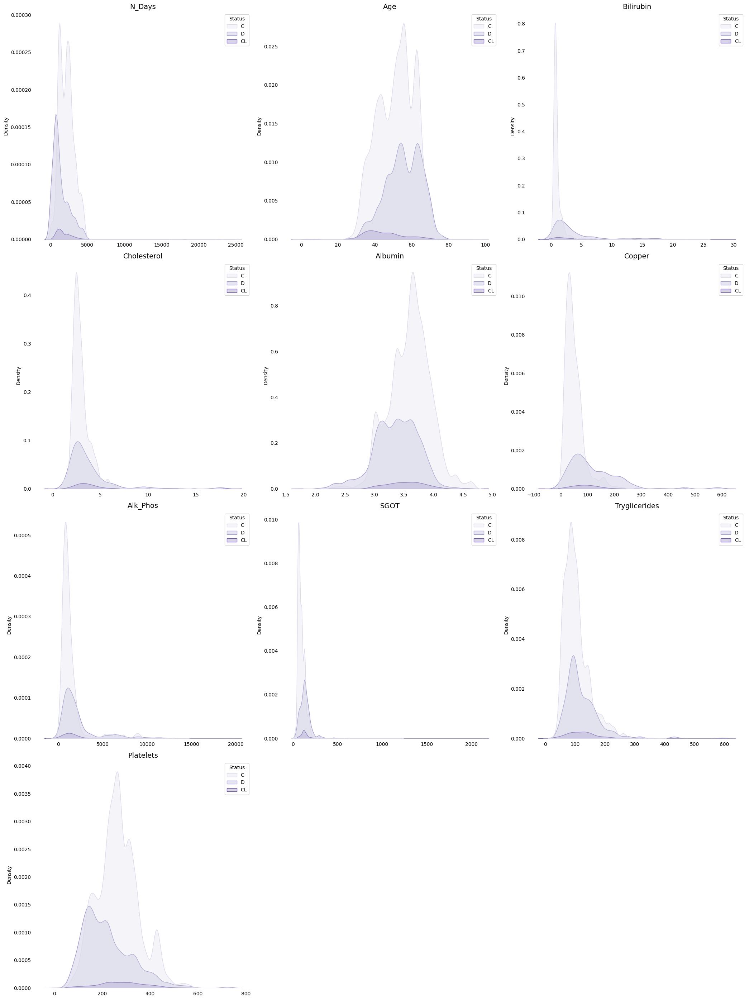

/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_4098/4161465305.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Status', y=col, data=train_df, palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_4098/4161465305.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Status', y=col, data=train_df, palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_4098/4161465305.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Status', y=col, data=train_df, palette='Set2')
/var/folders/74/

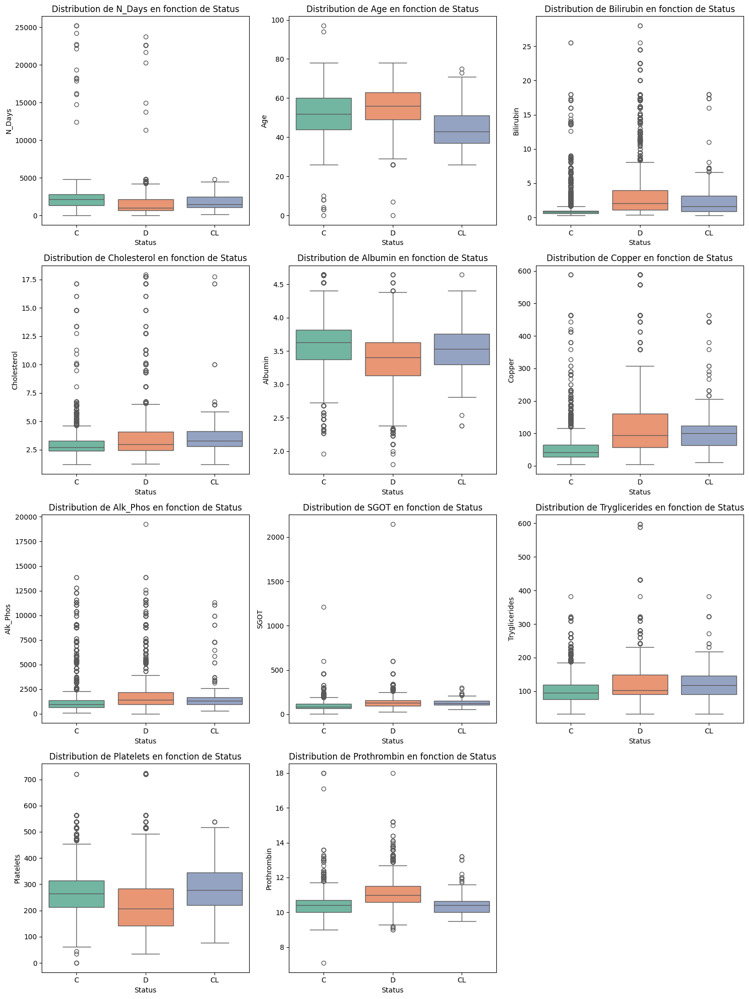

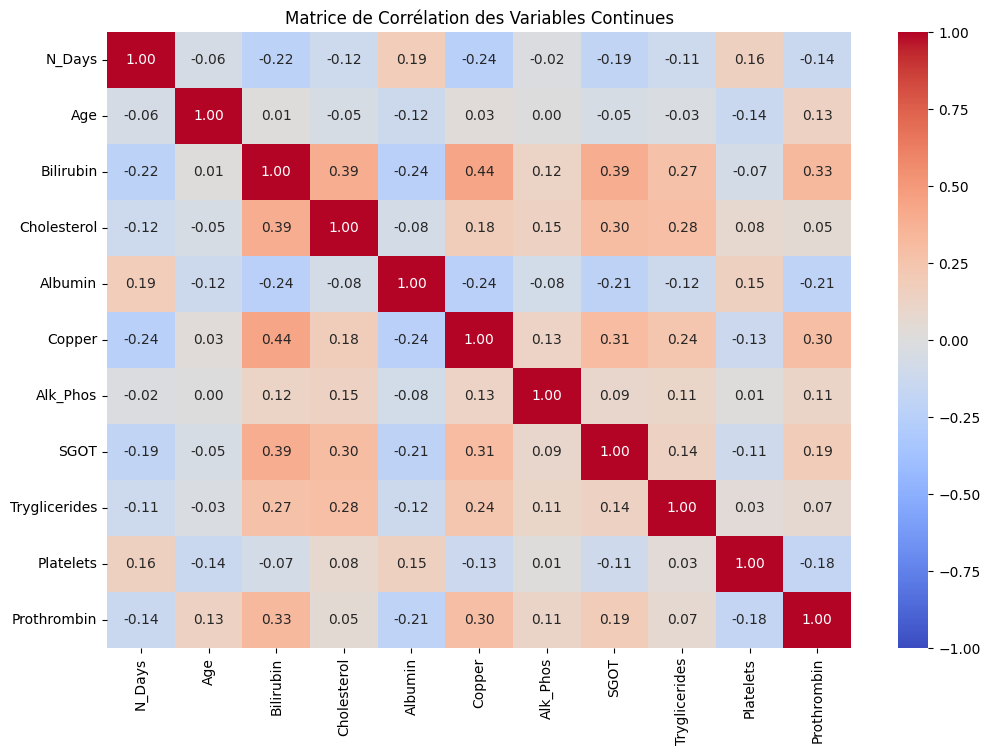

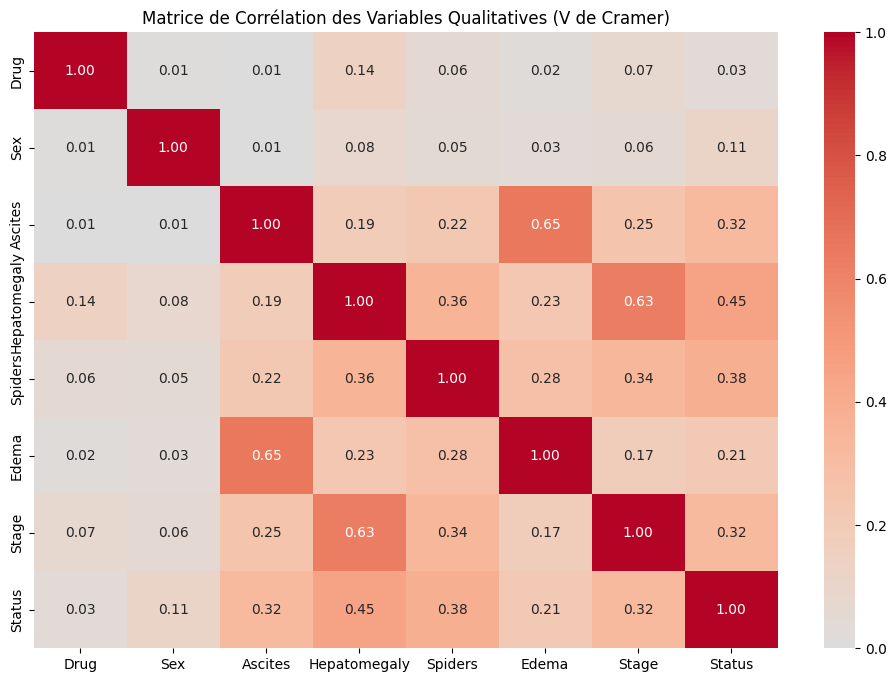

Variable : Drug
Statistique du chi-carré : 10.398610569958167
Valeur p : 0.005520398192462929


Variable : Sex
Statistique du chi-carré : 187.76010370560022
Valeur p : 1.6920434828805052e-41


Variable : Ascites
Statistique du chi-carré : 861.2489096270547
Valeur p : 9.597884113653021e-188


Variable : Hepatomegaly
Statistique du chi-carré : 1721.4629220345441
Valeur p : 0.0


Variable : Spiders
Statistique du chi-carré : 1261.8005479313981
Valeur p : 1.008073934491804e-274


Variable : Edema
Statistique du chi-carré : 1337.2522922055573
Valeur p : 2.7873191207540522e-288


Variable : Stage
Statistique du chi-carré : 2992.3917582734034
Valeur p : 0.0


N_Days: p-value test ANOVA = 0.0000
Age: p-value test ANOVA = 0.0000
Bilirubin: p-value test ANOVA = 0.0000
Cholesterol: p-value test ANOVA = 0.0000
Albumin: p-value test ANOVA = 0.0000
Copper: p-value test ANOVA = 0.0000
Alk_Phos: p-value test ANOVA = 0.0000
SGOT: p-value test ANOVA = 0.0000
Tryglicerides: p-value test ANOVA = 0.0000
Pl

In [2]:
# permet d'importer la table des données traitées dans EDA.ipynb
%run EDA.ipynb

In [3]:
train_df.head()

,id,N_Days,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage,Status
0,0,1055.0,NaN,54,F,NaN,NaN,NaN,N,1.3,NaN,3.64,NaN,NaN,NaN,NaN,209.0,10.5,3.0,C
1,1,3282.0,Placebo,49,F,N,Y,Y,N,0.7,3.09,3.60,96.0,1142.0,71.3,106.0,240.0,12.4,4.0,C
2,2,1653.0,NaN,56,F,NaN,NaN,NaN,N,2.2,NaN,3.64,NaN,NaN,NaN,NaN,139.0,9.5,2.0,C
3,3,999.0,D-penicillamine,62,F,N,Y,N,N,1.0,4.98,3.35,89.0,1601.0,164.3,85.0,394.0,9.7,3.0,C
4,4,2202.0,NaN,49,F,NaN,NaN,NaN,N,17.2,NaN,3.15,NaN,NaN,NaN,NaN,432.0,11.2,3.0,C


In [4]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             15000 non-null  int64  
 1   N_Days         15000 non-null  float64
 2   Drug           8564 non-null   object 
 3   Age            15000 non-null  int64  
 4   Sex            15000 non-null  object 
 5   Ascites        8561 non-null   object 
 6   Hepatomegaly   8563 non-null   object 
 7   Spiders        8555 non-null   object 
 8   Edema          15000 non-null  object 
 9   Bilirubin      15000 non-null  float64
 10  Cholesterol    6669 non-null   float64
 11  Albumin        15000 non-null  float64
 12  Copper         8452 non-null   float64
 13  Alk_Phos       8558 non-null   float64
 14  SGOT           8555 non-null   float64
 15  Tryglicerides  6630 non-null   float64
 16  Platelets      14414 non-null  float64
 17  Prothrombin    14974 non-null  float64
 18  Stage 

In [5]:
train_df.isnull().sum()/train_df.shape[0]

id               0.000000
N_Days           0.000000
Drug             0.429067
Age              0.000000
Sex              0.000000
Ascites          0.429267
Hepatomegaly     0.429133
Spiders          0.429667
Edema            0.000000
Bilirubin        0.000000
Cholesterol      0.555400
Albumin          0.000000
Copper           0.436533
Alk_Phos         0.429467
SGOT             0.429667
Tryglicerides    0.558000
Platelets        0.039067
Prothrombin      0.001733
Stage            0.000000
Status           0.000000
dtype: float64

## <span style="color:blue">Analyse détaillée des NaN</span>

##### Regarder si les NaN sont presents sur les meme individus

* Méthode 1 : Regarder les nombre d'individus avec les meme colonnes manquantes

In [10]:
# Méthode 1 :
for i in range(1,19):
    multiple_missing = train_df.isna().sum(axis=1) > i
    print (len(train_df[multiple_missing]), "individus qui ont", i, "colonnes de variables manquantes")

8331 individus qui ont 1 colonnes de variables manquantes
6523 individus qui ont 2 colonnes de variables manquantes
6449 individus qui ont 3 colonnes de variables manquantes
6447 individus qui ont 4 colonnes de variables manquantes
6444 individus qui ont 5 colonnes de variables manquantes
6444 individus qui ont 6 colonnes de variables manquantes
6441 individus qui ont 7 colonnes de variables manquantes
6407 individus qui ont 8 colonnes de variables manquantes
354 individus qui ont 9 colonnes de variables manquantes
1 individus qui ont 10 colonnes de variables manquantes
0 individus qui ont 11 colonnes de variables manquantes
0 individus qui ont 12 colonnes de variables manquantes
0 individus qui ont 13 colonnes de variables manquantes
0 individus qui ont 14 colonnes de variables manquantes
0 individus qui ont 15 colonnes de variables manquantes
0 individus qui ont 16 colonnes de variables manquantes
0 individus qui ont 17 colonnes de variables manquantes
0 individus qui ont 18 colonnes

> Il semble que qu'un groupe de [6449;6407] individus n'ont pas répondus à 3-8 variables 

In [11]:
# Avec seulement les variables categorielles
corr_cols_cat = ["Drug", "Ascites", "Hepatomegaly", "Spiders", "Stage"]

In [ ]:
for i in range(1, len(corr_cols_cat) + 1):  
    multiple_missing = train_df[corr_cols_cat].isna().sum(axis=1) == i  
    print(len(train_df[multiple_missing]), "individus qui ont", i, "valeurs manquantes dans les variables sélectionnées")


5 individus qui ont 1 valeurs manquantes dans les variables sélectionnées
4 individus qui ont 2 valeurs manquantes dans les variables sélectionnées
28 individus qui ont 3 valeurs manquantes dans les variables sélectionnées
6415 individus qui ont 4 valeurs manquantes dans les variables sélectionnées
0 individus qui ont 5 valeurs manquantes dans les variables sélectionnées


> On remarque que 6415 individus ont les meme valeurs manquantes

* Méthode 2 : Correlation des valeurs manquantes

In [13]:
# On récupère seulement les variables avec des valeurs manquantes :
train_df_na = train_df.loc[:, train_df.isna().sum() != 0]
train_df_na

,Drug,Ascites,Hepatomegaly,Spiders,Cholesterol,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,209.0,10.5
1,Placebo,N,Y,Y,3.09,96.0,1142.0,71.30,106.0,240.0,12.4
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,139.0,9.5
3,D-penicillamine,N,Y,N,4.98,89.0,1601.0,164.30,85.0,394.0,9.7
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,432.0,11.2
...,...,...,...,...,...,...,...,...,...,...,...
14995,Placebo,N,N,Y,3.22,52.0,1257.0,60.45,213.0,228.0,9.9
14996,D-penicillamine,Y,Y,N,NaN,18.0,976.0,97.65,NaN,126.0,11.0
14997,Placebo,N,Y,Y,3.48,464.0,933.0,120.00,146.0,322.0,10.6
14998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,233.0,11.0


In [14]:
# Créer une matrice binaire pour les valeurs manquantes
missing_matrix = train_df_na.isnull().astype(int)
missing_matrix

,Drug,Ascites,Hepatomegaly,Spiders,Cholesterol,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin
0,1,1,1,1,1,1,1,1,1,0,0
1,0,0,0,0,0,0,0,0,0,0,0
2,1,1,1,1,1,1,1,1,1,0,0
3,0,0,0,0,0,0,0,0,0,0,0
4,1,1,1,1,1,1,1,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...
14995,0,0,0,0,0,0,0,0,0,0,0
14996,0,0,0,0,1,0,0,0,1,0,0
14997,0,0,0,0,0,0,0,0,0,0,0
14998,1,1,1,1,1,1,1,1,1,0,0


In [15]:
# Calculer la corrélation entre colonnes de valeurs manquantes
correlation_matrix = missing_matrix.corr()
correlation_matrix

,Drug,Ascites,Hepatomegaly,Spiders,Cholesterol,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin
Drug,1.000000,0.996326,0.997687,0.998504,0.775353,0.984092,0.998368,0.998776,0.770464,0.054619,0.048067
Ascites,0.996326,1.000000,0.996190,0.997552,0.775128,0.983136,0.996871,0.997280,0.770237,0.055230,0.048048
Hepatomegaly,0.997687,0.996190,1.000000,0.998096,0.775459,0.983683,0.998232,0.998368,0.770569,0.054591,0.048061
Spiders,0.998504,0.997552,0.998096,1.000000,0.776304,0.985299,0.999048,0.999456,0.771410,0.054365,0.048008
Cholesterol,0.775353,0.775128,0.775459,0.776304,1.000000,0.771821,0.775987,0.776304,0.993125,0.021836,0.037282
Copper,0.984092,0.983136,0.983683,0.985299,0.771821,1.000000,0.984896,0.985299,0.767133,0.051472,0.047342
Alk_Phos,0.998368,0.996871,0.998232,0.999048,0.775987,0.984896,1.000000,0.999592,0.771095,0.054450,0.048028
SGOT,0.998776,0.997280,0.998368,0.999456,0.776304,0.985299,0.999592,1.000000,0.771410,0.054365,0.048008
Tryglicerides,0.770464,0.770237,0.770569,0.771410,0.993125,0.767133,0.771095,0.771410,1.000000,0.019408,0.037086
Platelets,0.054619,0.055230,0.054591,0.054365,0.021836,0.051472,0.054450,0.054365,0.019408,1.000000,-0.000130


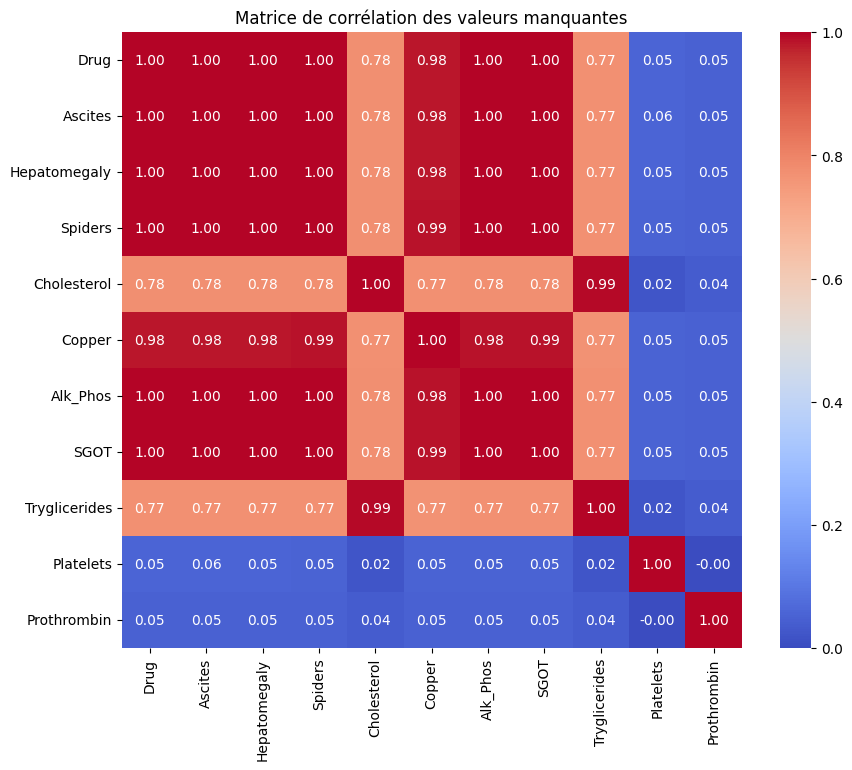

In [16]:
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Matrice de corrélation des valeurs manquantes")
plt.show()

In [17]:
"Drug", "Ascites", "Hepatomegaly", "Spiders", "Cholesterol", "Copper", "Alk Phos", "SGOT", "Tryglicerides"
"Platelets", "Prothrombin"

('Platelets', 'Prothrombin')

> Beaucoup d'individus de semble pas avoir répondus pour certaines variables 
> On constate que les variables "Drug", "Ascites", "Hepatomegaly", "Spiders", "Cholesterol", "Copper", "Alk_Phos", "SGOT", "Tryglicerides" sont tres correlés au niveau des valeurs manquantes

* Methode 3 : On prend les variables corrélée en valeur manquantes

In [23]:
# Séparer les variables avec valeurs manquantes (Variables corrélées et indépendantes) +"Status"
corr_cols = ["Drug", "Ascites", "Hepatomegaly", "Spiders", "Cholesterol", "Copper", "Alk_Phos", "SGOT", "Tryglicerides", "Status"]
indep_cols= ["Platelets", "Prothrombin"]

In [24]:
df_corr= train_df[corr_cols]
missing_values_count = df_corr.isna().sum(axis=1)

# Sélectionner les individus ayant plus de 5 valeurs manquantes
selected_individuals = df_corr[missing_values_count > 5]
selected_individuals


,Drug,Ascites,Hepatomegaly,Spiders,Cholesterol,Copper,Alk_Phos,SGOT,Tryglicerides,Status
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,C
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,C
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,C
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,D
11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,C
...,...,...,...,...,...,...,...,...,...,...
14991,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,D
14992,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,C
14994,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,C
14998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,D


In [ ]:
selected_individuals["Status"].value_counts()

Status
C     4235
D     2060
CL     149
Name: count, dtype: int64

> - il n'y a pas forcement de modalités dominantes dans le groupe de non répondants
> - ainsi les personnes qui n'ont pas répondus aux meme varaibles ne semblent pas forcement avoir le même status .
> - Il est donc non pertinant de créer une variable binaire de non réponse
> - il serait mieux de partir de cet echantillon est de recoder les NaN en no-response et pour les autres valeur manquantes imputer 

## <span style="color:red">Traitement des NaN</span>

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             15000 non-null  int64  
 1   N_Days         15000 non-null  float64
 2   Drug           8564 non-null   object 
 3   Age            15000 non-null  float64
 4   Sex            15000 non-null  object 
 5   Ascites        8563 non-null   object 
 6   Hepatomegaly   8564 non-null   object 
 7   Spiders        8555 non-null   object 
 8   Edema          15000 non-null  object 
 9   Bilirubin      15000 non-null  float64
 10  Cholesterol    6669 non-null   float64
 11  Albumin        15000 non-null  float64
 12  Copper         8452 non-null   float64
 13  Alk_Phos       8558 non-null   float64
 14  SGOT           8555 non-null   float64
 15  Tryglicerides  6630 non-null   float64
 16  Platelets      14414 non-null  float64
 17  Prothrombin    14974 non-null  float64
 18  Stage 

/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_44493/3677733665.py:2: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[ 2990.    133.3   133.3 13727.  17874. ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  train_df.loc[train_df['N_Days'] > train_df['Age'], 'N_Days'] = train_df['Age']
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_44493/3371030689.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=train_df, palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_44493/3371030689.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same eff

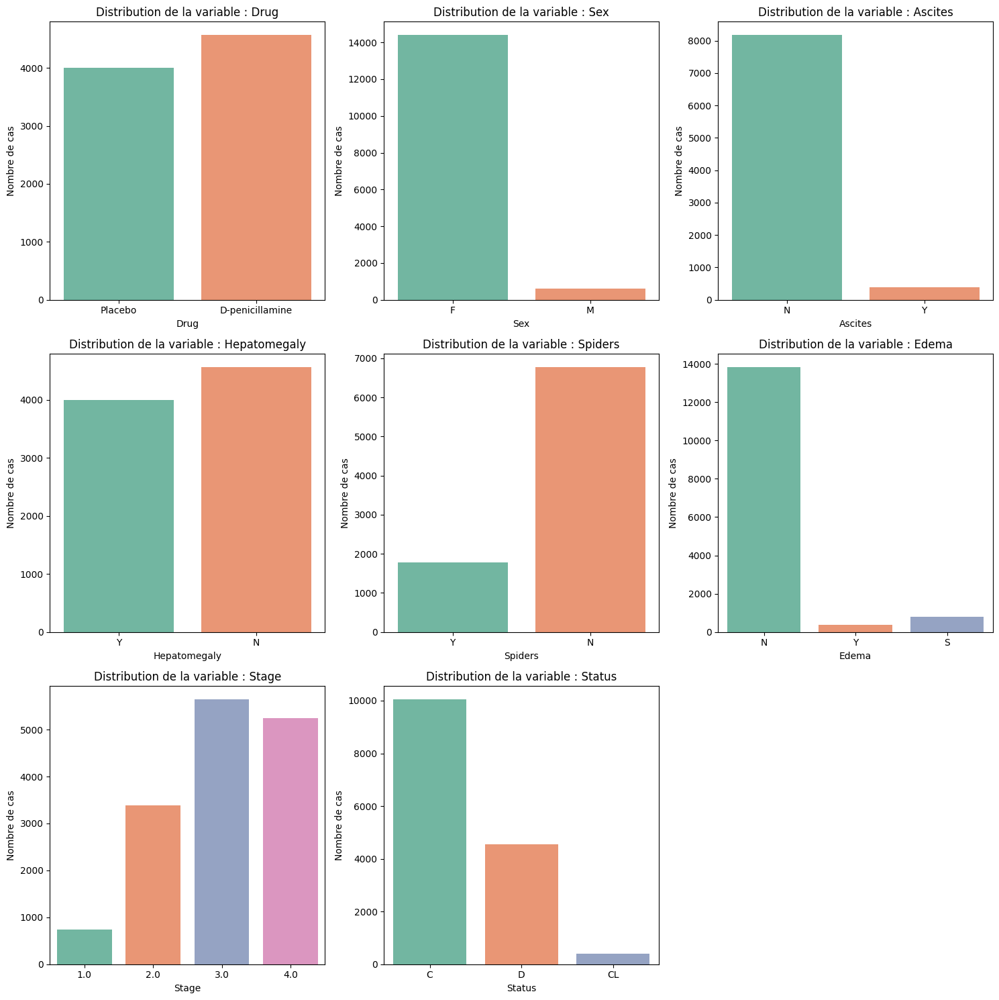

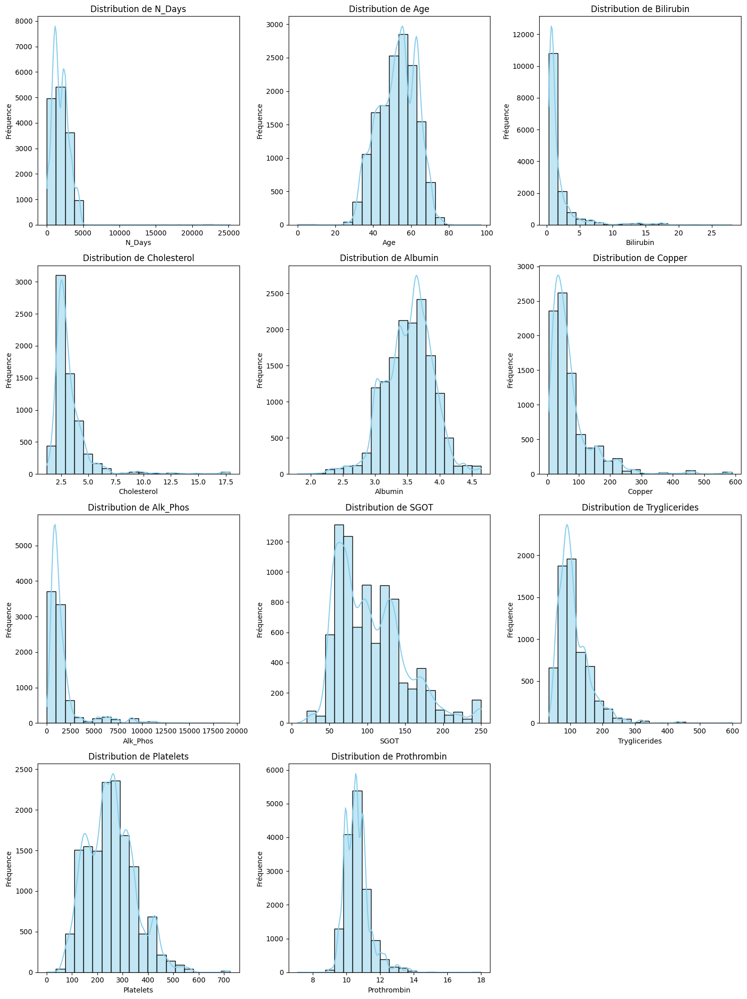

/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_44493/350439153.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=train_df[col], palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_44493/350439153.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=train_df[col], palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_44493/350439153.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=train_df[col], palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_44493/35

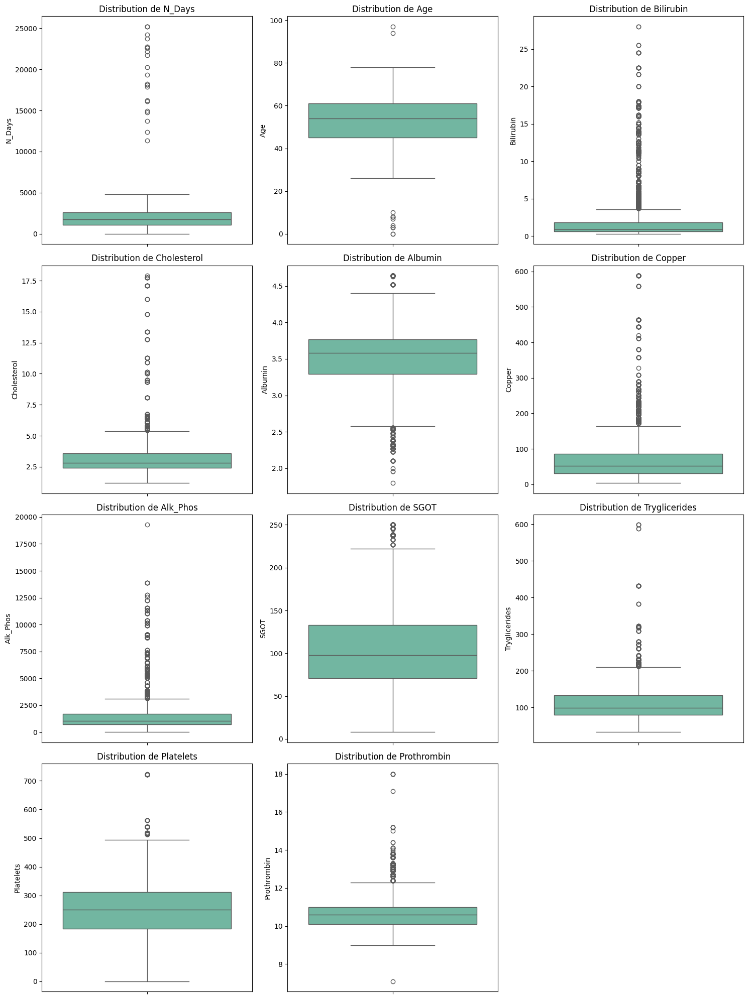

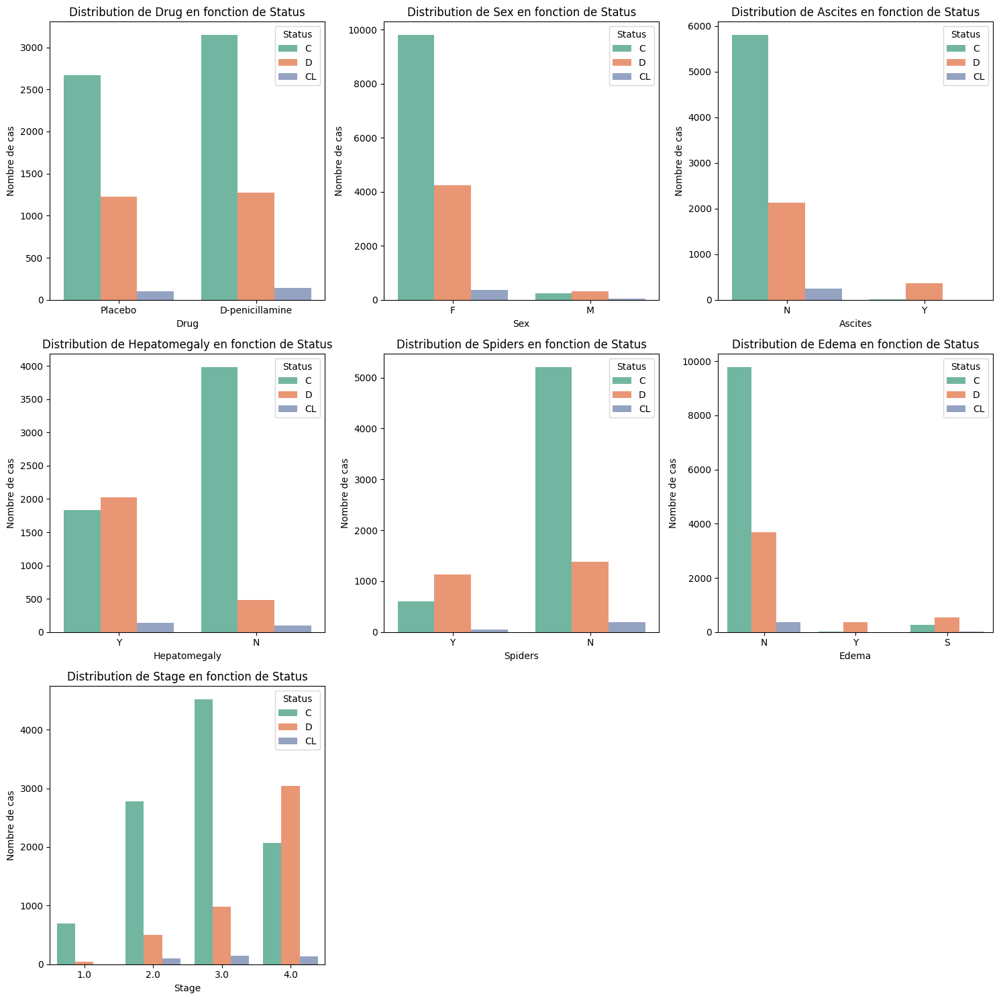

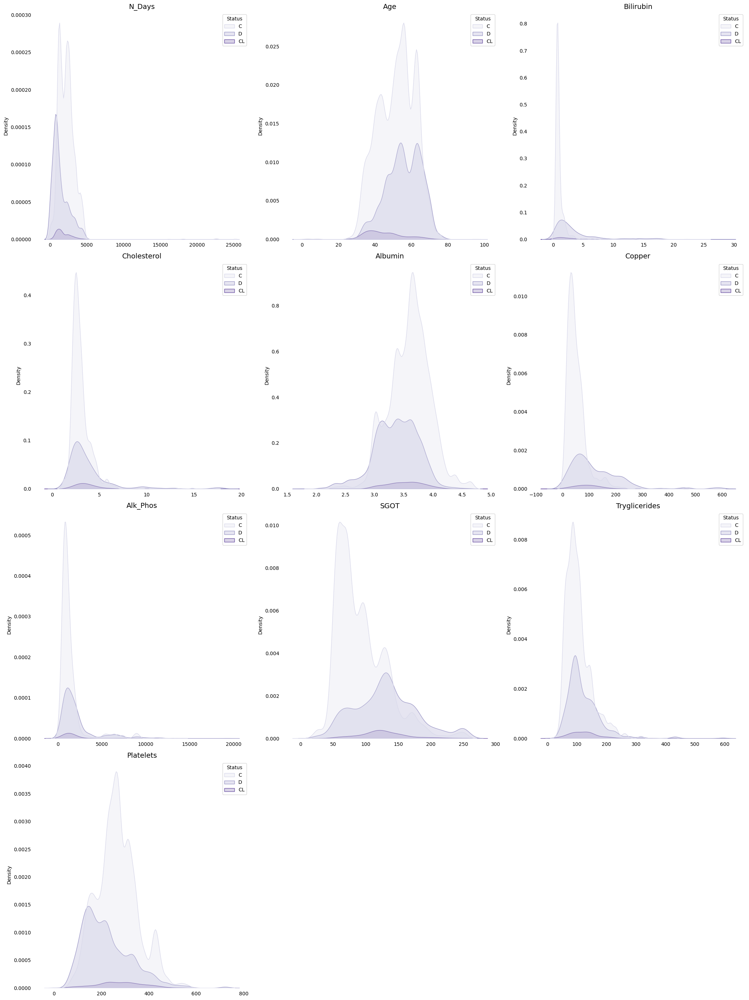

/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_44493/4161465305.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Status', y=col, data=train_df, palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_44493/4161465305.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Status', y=col, data=train_df, palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_44493/4161465305.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Status', y=col, data=train_df, palette='Set2')
/var/folders/

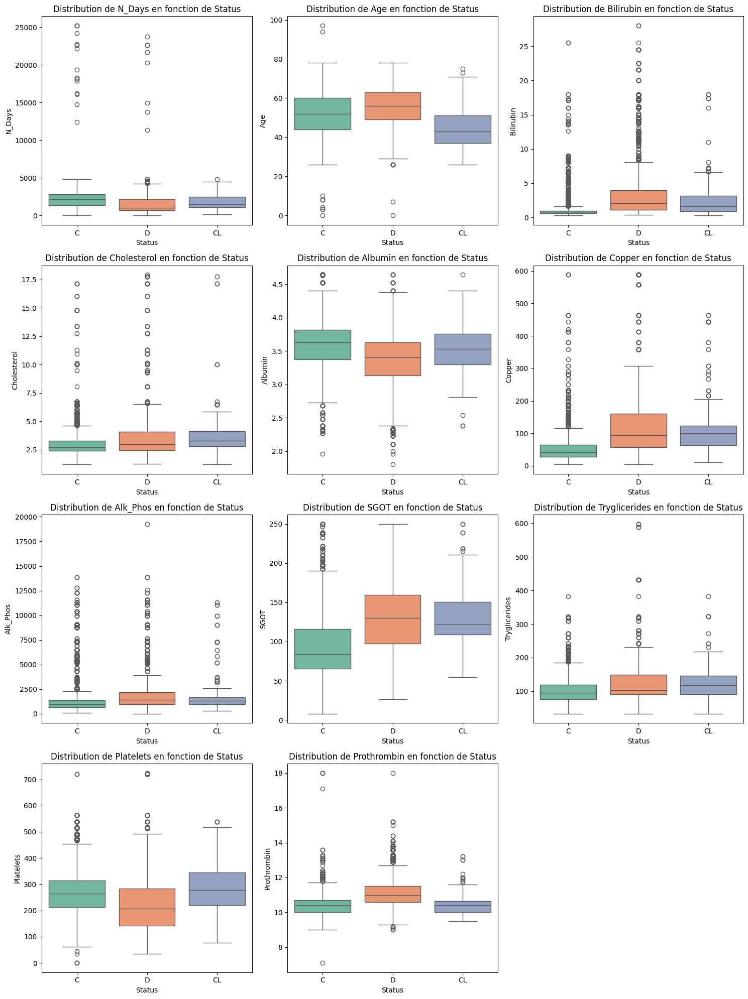

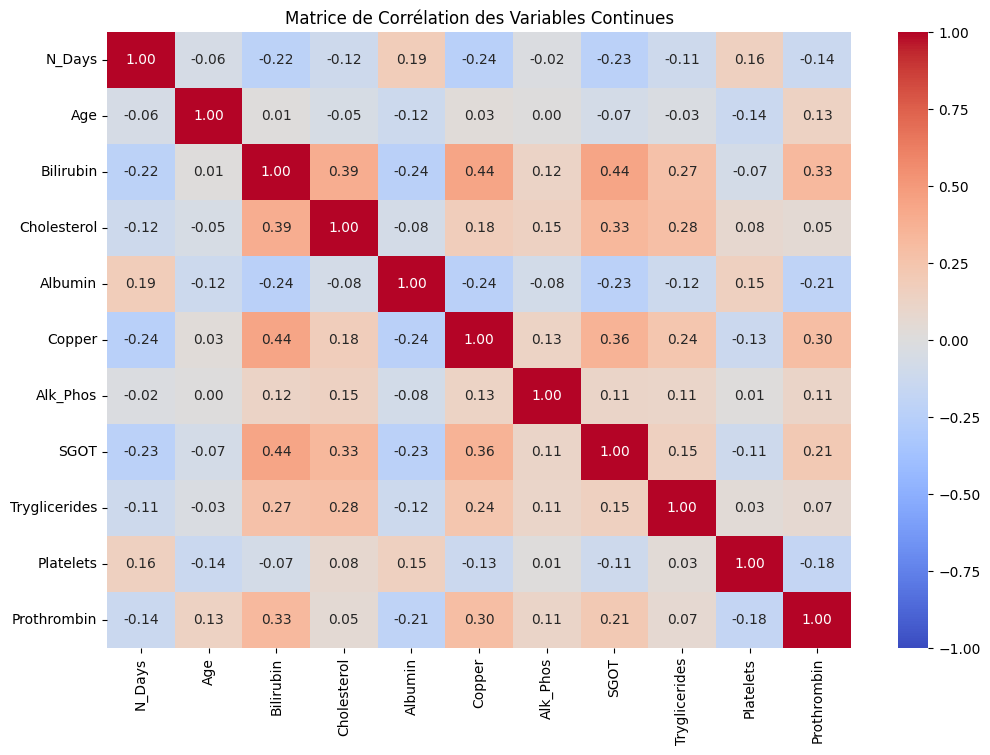

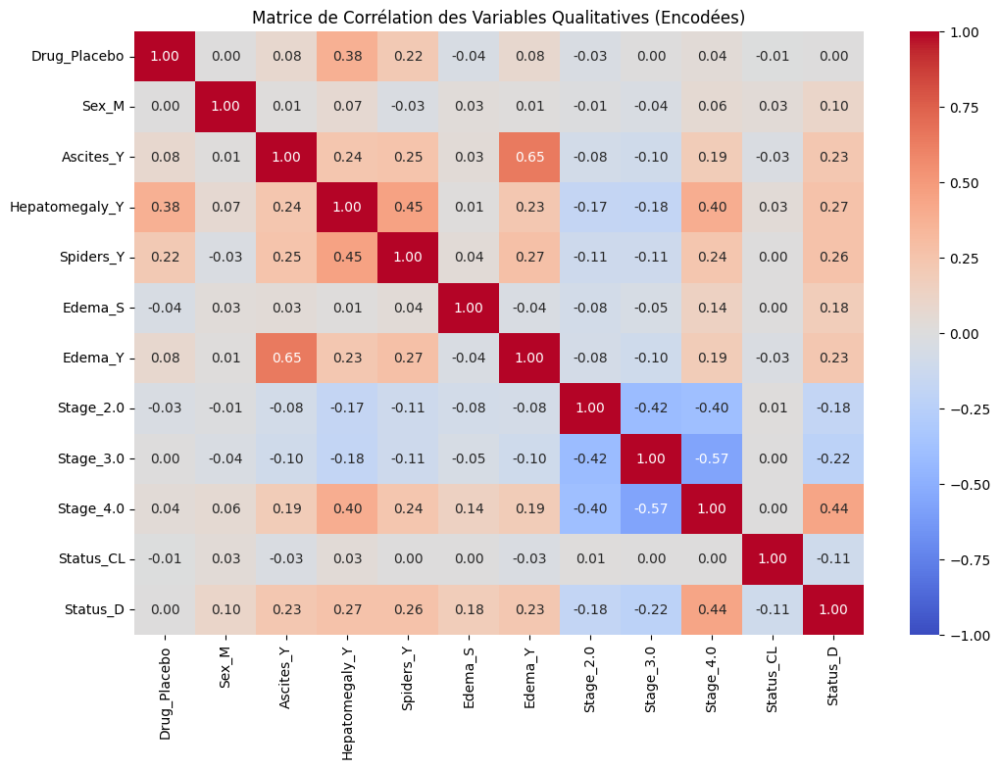

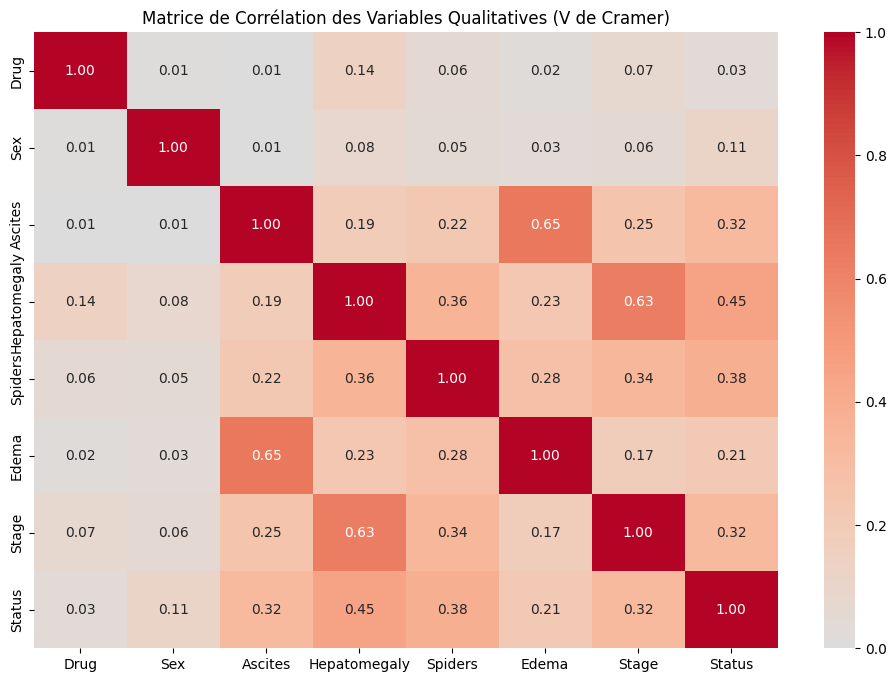

Variable : Drug
Statistique du chi-carré : 10.398610569958167
Valeur p : 0.005520398192462929


Variable : Sex
Statistique du chi-carré : 187.76010370560022
Valeur p : 1.6920434828805052e-41


Variable : Ascites
Statistique du chi-carré : 861.2489096270547
Valeur p : 9.597884113653021e-188


Variable : Hepatomegaly
Statistique du chi-carré : 1721.4629220345441
Valeur p : 0.0


Variable : Spiders
Statistique du chi-carré : 1261.8005479313981
Valeur p : 1.008073934491804e-274


Variable : Edema
Statistique du chi-carré : 1337.2522922055573
Valeur p : 2.7873191207540522e-288


Variable : Stage
Statistique du chi-carré : 2992.3917582734034
Valeur p : 0.0


N_Days: p-value test ANOVA = 0.0000
Age: p-value test ANOVA = 0.0000
Bilirubin: p-value test ANOVA = 0.0000
Cholesterol: p-value test ANOVA = 0.0000
Albumin: p-value test ANOVA = 0.0000
Copper: p-value test ANOVA = 0.0000
Alk_Phos: p-value test ANOVA = 0.0000
SGOT: p-value test ANOVA = 0.0000
Tryglicerides: p-value test ANOVA = 0.0000
Pl

In [204]:
%run EDA.ipynb

In [205]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             15000 non-null  int64  
 1   N_Days         15000 non-null  float64
 2   Drug           8564 non-null   object 
 3   Age            15000 non-null  int64  
 4   Sex            15000 non-null  object 
 5   Ascites        8561 non-null   object 
 6   Hepatomegaly   8563 non-null   object 
 7   Spiders        8555 non-null   object 
 8   Edema          15000 non-null  object 
 9   Bilirubin      15000 non-null  float64
 10  Cholesterol    6669 non-null   float64
 11  Albumin        15000 non-null  float64
 12  Copper         8452 non-null   float64
 13  Alk_Phos       8558 non-null   float64
 14  SGOT           8555 non-null   float64
 15  Tryglicerides  6630 non-null   float64
 16  Platelets      14414 non-null  float64
 17  Prothrombin    14974 non-null  float64
 18  Stage 

### <span style="color:blue">Méthode 1 :</span>

> - Catégories manquantes : L'attribution de la catégorie "Missing" pour toutes les valeurs manquantes des variables catégorielles.
> - KNN : Imputation des valeurs manquantes pour les variables continues restantes.

In [208]:
# 1. Gestion des variables catégoriques
categorical_cols = ["Drug", "Ascites", "Hepatomegaly", "Spiders", "Stage"] # on prend toutes les variables catégorielles a valeurs manquantes
for col in categorical_cols:
    train_df[col] = train_df[col].fillna("Missing")  # S'il y a des valeur manquantes mettrre la modalité "Missing"
    train_df[col] = train_df[col].astype("object")

/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_44493/909086493.py:4: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  train_df[col] = train_df[col].fillna("Missing")  # S'il y a des valeur manquantes mettrre la modalité "Missing"


In [209]:
train_df.head()

,id,N_Days,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage,Status
0,0,1055.0,Missing,54,F,Missing,Missing,Missing,N,1.3,NaN,3.64,NaN,NaN,NaN,NaN,209.0,10.5,3.0,C
1,1,3282.0,Placebo,49,F,N,Y,Y,N,0.7,3.09,3.60,96.0,1142.0,71.3,106.0,240.0,12.4,4.0,C
2,2,1653.0,Missing,56,F,Missing,Missing,Missing,N,2.2,NaN,3.64,NaN,NaN,NaN,NaN,139.0,9.5,2.0,C
3,3,999.0,D-penicillamine,62,F,N,Y,N,N,1.0,4.98,3.35,89.0,1601.0,164.3,85.0,394.0,9.7,3.0,C
4,4,2202.0,Missing,49,F,Missing,Missing,Missing,N,17.2,NaN,3.15,NaN,NaN,NaN,NaN,432.0,11.2,3.0,C


In [210]:
train_df.isna().sum()

id                  0
N_Days              0
Drug                0
Age                 0
Sex                 0
Ascites             0
Hepatomegaly        0
Spiders             0
Edema               0
Bilirubin           0
Cholesterol      8331
Albumin             0
Copper           6548
Alk_Phos         6442
SGOT             6445
Tryglicerides    8370
Platelets         586
Prothrombin        26
Stage               0
Status              0
dtype: int64

In [211]:
# 2. Variables numériques avec corrélations élevées (imputation multivariée)
numerical_cols = ["Bilirubin", "Cholesterol", "Albumin", "Copper", "Alk_Phos", 
                  "SGOT", "Tryglicerides", "Platelets", "Prothrombin", "N_Days"]

# KNN Imputer
imputer = KNNImputer(n_neighbors=108)
train_df[numerical_cols] = imputer.fit_transform(train_df[numerical_cols])


In [212]:
# jouer avec le paramètre n_neighbors lors des test

In [ ]:
neighbors_range = list(range(1,151))

mae_scores = []

# Test de chaque valeur de n_neighbors
for n_neighbors in neighbors_range:
    imputer = KNNImputer(n_neighbors=n_neighbors)
    
    imputed_data = imputer.fit_transform(train_df[numerical_cols])
    
    mae_scores.append(np.random.random())  

for n_neighbors, score in zip(neighbors_range, mae_scores):
    print(f"n_neighbors = {n_neighbors}, MAE = {score}")

best_n_neighbors = neighbors_range[np.argmin(mae_scores)]
print(f"Meilleur n_neighbors = {best_n_neighbors}")


n_neighbors = 1, MAE = 0.48635469033539425
n_neighbors = 2, MAE = 0.7131930438153752
n_neighbors = 3, MAE = 0.31214826165019816
n_neighbors = 4, MAE = 0.41009819176577356
n_neighbors = 5, MAE = 0.24473447936770376
n_neighbors = 6, MAE = 0.12842035033049093
n_neighbors = 7, MAE = 0.7203438097051329
n_neighbors = 8, MAE = 0.5118413837965036
n_neighbors = 9, MAE = 0.18558655555684123
n_neighbors = 10, MAE = 0.013985662468312787
n_neighbors = 11, MAE = 0.496001276047666
n_neighbors = 12, MAE = 0.024202716498798682
n_neighbors = 13, MAE = 0.013300161592955995
n_neighbors = 14, MAE = 0.04923102396578738
n_neighbors = 15, MAE = 0.09666291303807195
n_neighbors = 16, MAE = 0.05878800230604486
n_neighbors = 17, MAE = 0.3925460639013286
n_neighbors = 18, MAE = 0.40935467795618474
n_neighbors = 19, MAE = 0.7751223802734394
n_neighbors = 20, MAE = 0.28363386654136646
n_neighbors = 21, MAE = 0.9645641357060075
n_neighbors = 22, MAE = 0.46133078856912557
n_neighbors = 23, MAE = 0.7222619618270163
n_n

In [214]:
# 3. Vérification des valeurs manquantes
print(train_df.isna().sum())


id               0
N_Days           0
Drug             0
Age              0
Sex              0
Ascites          0
Hepatomegaly     0
Spiders          0
Edema            0
Bilirubin        0
Cholesterol      0
Albumin          0
Copper           0
Alk_Phos         0
SGOT             0
Tryglicerides    0
Platelets        0
Prothrombin      0
Stage            0
Status           0
dtype: int64


### <span style="color:blue">Méthode 1 bis (ameliorée):</span>

> - On repere les varaibles les plus corrélée en termes de valeurs manquantes. On regarde ensuite les individus avec des valeur manquantes sur plusieurs de ces variables.
> - Catégories manquantes : L'attribution de la catégorie "Missing" pour les valeurs manquantes de l'échantillon précedant
> - Médiane : Imputation des valeurs manquantes pour les variables continues restantes.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             15000 non-null  int64  
 1   N_Days         15000 non-null  float64
 2   Drug           8564 non-null   object 
 3   Age            15000 non-null  float64
 4   Sex            15000 non-null  object 
 5   Ascites        8563 non-null   object 
 6   Hepatomegaly   8564 non-null   object 
 7   Spiders        8555 non-null   object 
 8   Edema          15000 non-null  object 
 9   Bilirubin      15000 non-null  float64
 10  Cholesterol    6669 non-null   float64
 11  Albumin        15000 non-null  float64
 12  Copper         8452 non-null   float64
 13  Alk_Phos       8558 non-null   float64
 14  SGOT           8555 non-null   float64
 15  Tryglicerides  6630 non-null   float64
 16  Platelets      14414 non-null  float64
 17  Prothrombin    14974 non-null  float64
 18  Stage 

/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/3677733665.py:2: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[ 2990.    133.3   133.3 13727.  17874. ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  train_df.loc[train_df['N_Days'] > train_df['Age'], 'N_Days'] = train_df['Age']
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/3371030689.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=train_df, palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/3371030689.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same eff

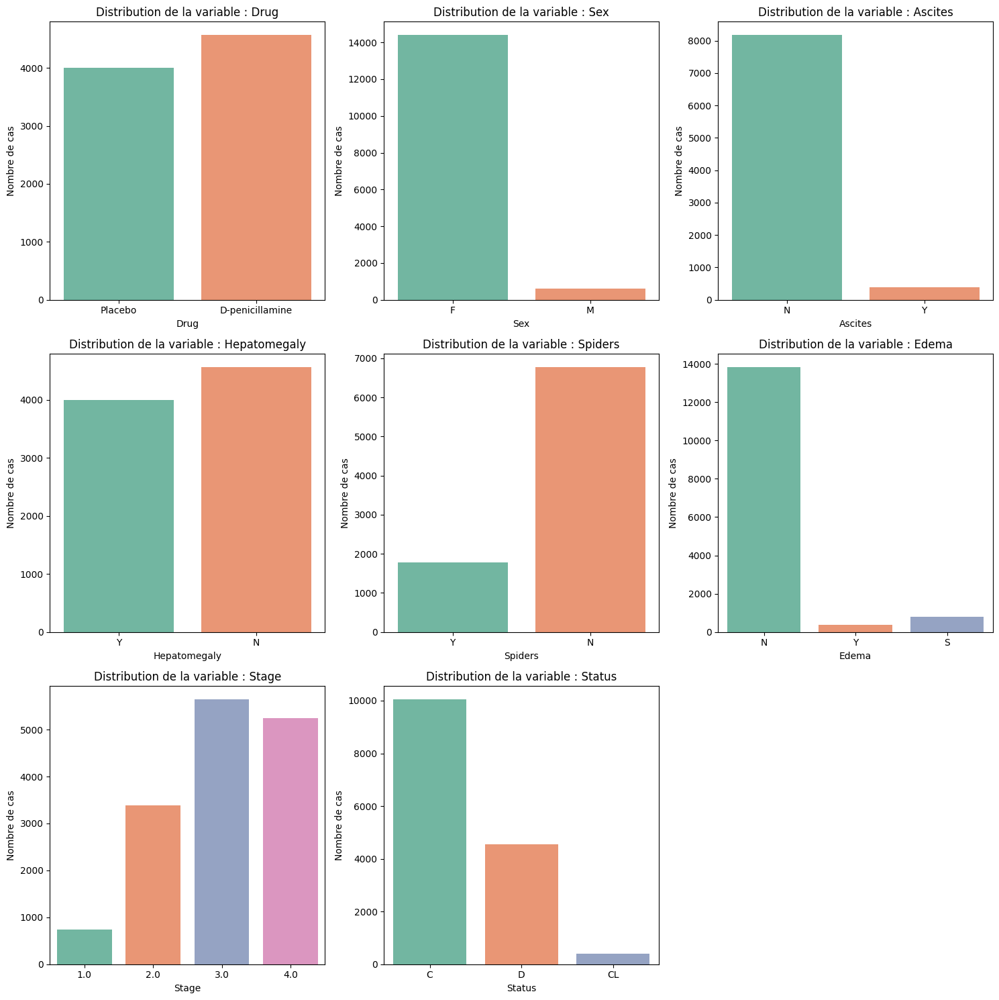

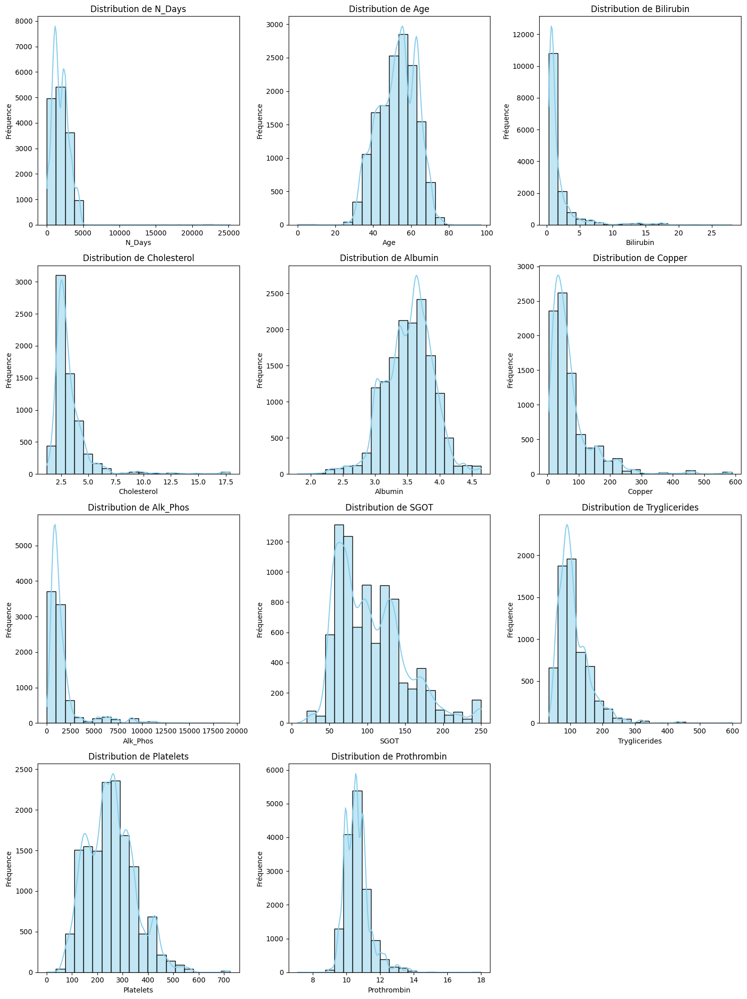

/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/350439153.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=train_df[col], palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/350439153.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=train_df[col], palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/350439153.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=train_df[col], palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/35

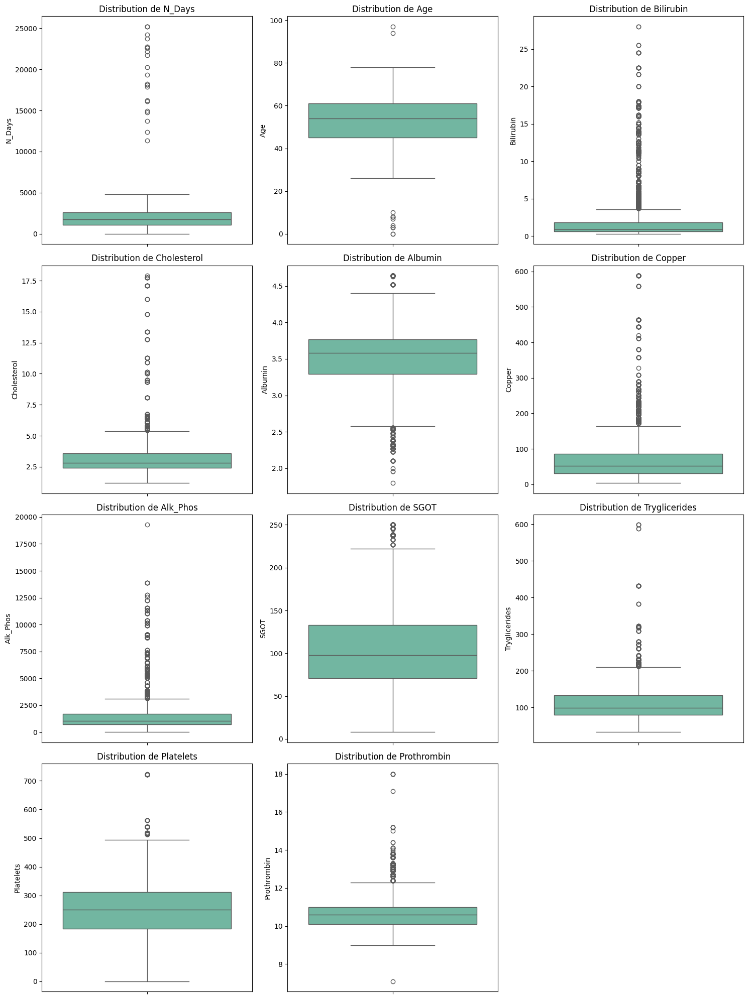

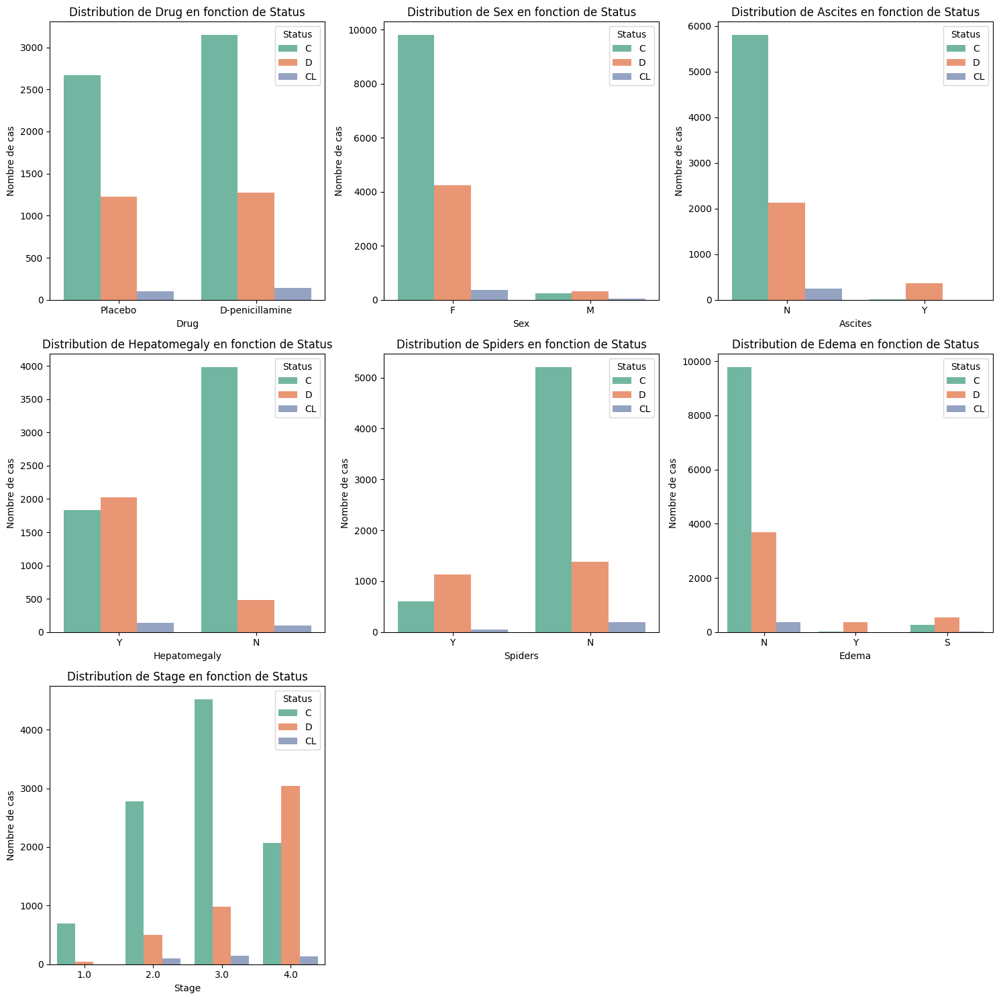

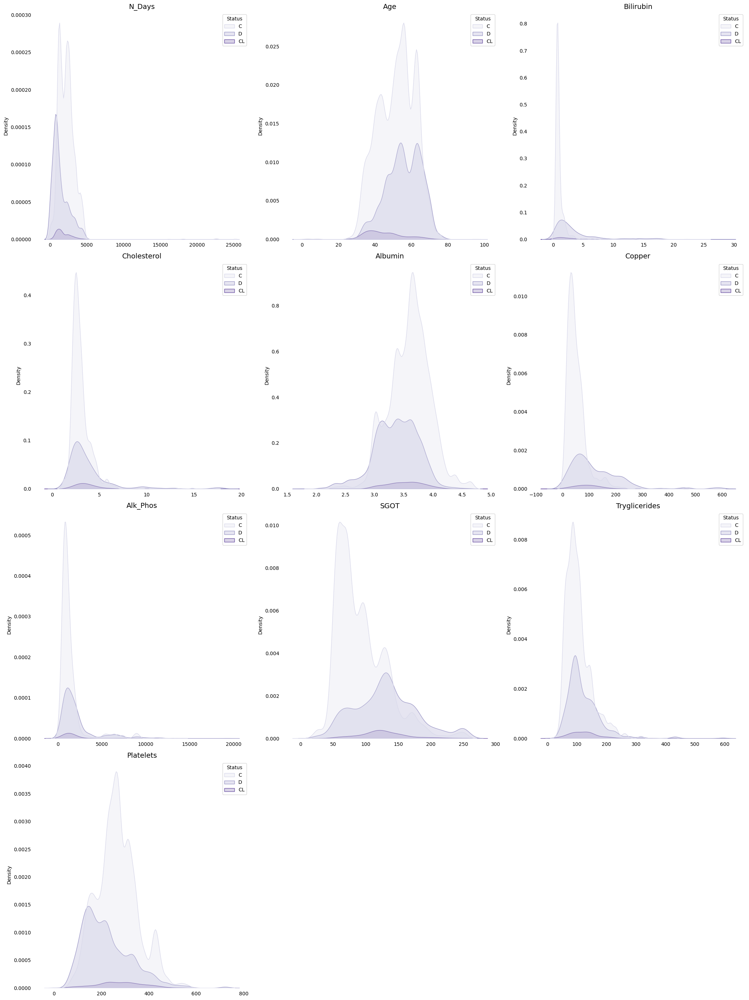

/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/4161465305.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Status', y=col, data=train_df, palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/4161465305.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Status', y=col, data=train_df, palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/4161465305.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Status', y=col, data=train_df, palette='Set2')
/var/folders/

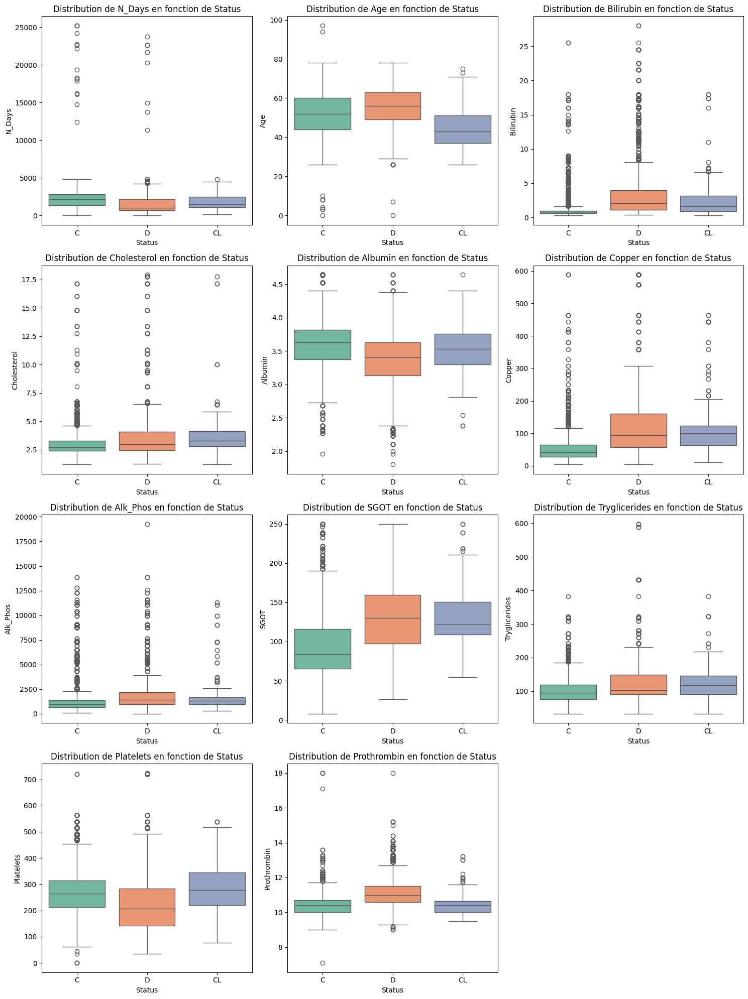

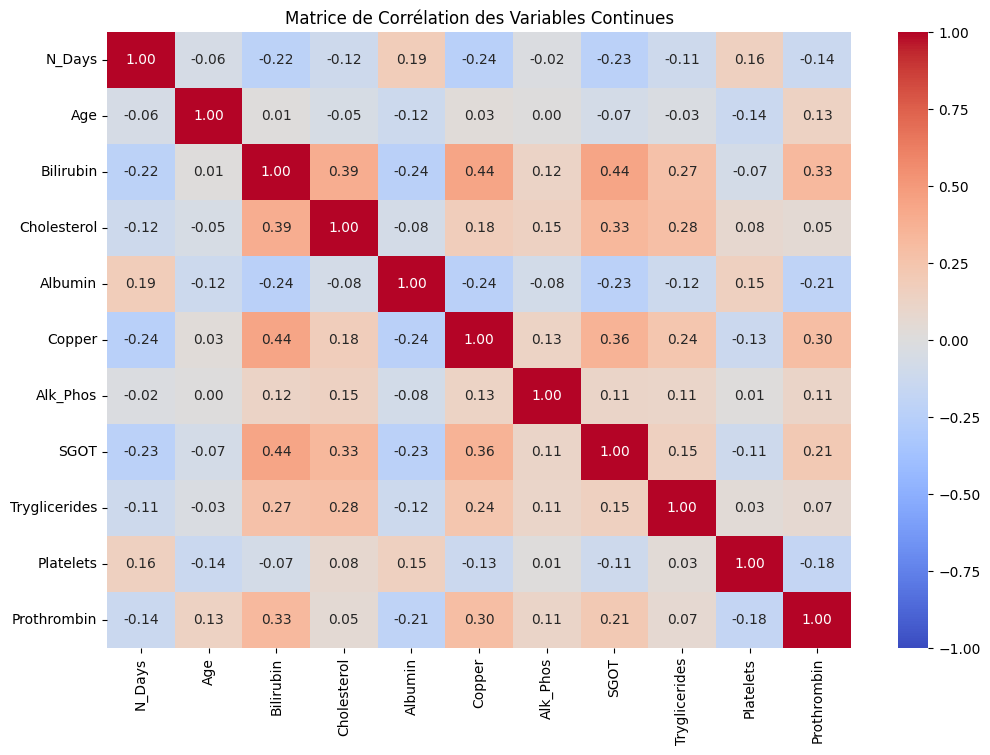

Variable : Drug
Statistique du chi-carré : 10.398610569958167
Valeur p : 0.005520398192462929


Variable : Sex
Statistique du chi-carré : 187.76010370560022
Valeur p : 1.6920434828805052e-41


Variable : Ascites
Statistique du chi-carré : 861.2489096270547
Valeur p : 9.597884113653021e-188


Variable : Hepatomegaly
Statistique du chi-carré : 1721.4629220345441
Valeur p : 0.0


Variable : Spiders
Statistique du chi-carré : 1261.8005479313981
Valeur p : 1.008073934491804e-274


Variable : Edema
Statistique du chi-carré : 1337.2522922055573
Valeur p : 2.7873191207540522e-288


Variable : Stage
Statistique du chi-carré : 2992.3917582734034
Valeur p : 0.0


N_Days: p-value test ANOVA = 0.0000
Age: p-value test ANOVA = 0.0000
Bilirubin: p-value test ANOVA = 0.0000
Cholesterol: p-value test ANOVA = 0.0000
Albumin: p-value test ANOVA = 0.0000
Copper: p-value test ANOVA = 0.0000
Alk_Phos: p-value test ANOVA = 0.0000
SGOT: p-value test ANOVA = 0.0000
Tryglicerides: p-value test ANOVA = 0.0000
Pl

In [103]:
%run EDA.ipynb

In [104]:
# 1. Gestion des variables catégoriques les plsu corrélées en valeurs manquantes
corr_cols_cat = ["Drug", "Ascites", "Hepatomegaly", "Spiders", "Stage"]

In [105]:
df_corr_cat = train_df[corr_cols_cat]
df_corr_cat.head()

,Drug,Ascites,Hepatomegaly,Spiders,Stage
0,NaN,NaN,NaN,NaN,3.0
1,Placebo,N,Y,Y,4.0
2,NaN,NaN,NaN,NaN,2.0
3,D-penicillamine,N,Y,N,3.0
4,NaN,NaN,NaN,NaN,3.0


In [107]:
# Sélectionner les individus avec plus de 4 valeurs manquantes dans les variables de corr_cols_cat
missing_values_count = df_corr_cat.isna().sum(axis=1)
selected_individuals = df_corr_cat[missing_values_count >= 4]
selected_individuals

,Drug,Ascites,Hepatomegaly,Spiders,Stage
0,NaN,NaN,NaN,NaN,3.0
2,NaN,NaN,NaN,NaN,2.0
4,NaN,NaN,NaN,NaN,3.0
7,NaN,NaN,NaN,NaN,4.0
11,NaN,NaN,NaN,NaN,3.0
...,...,...,...,...,...
14991,NaN,NaN,NaN,NaN,2.0
14992,NaN,NaN,NaN,NaN,3.0
14994,NaN,NaN,NaN,NaN,3.0
14998,NaN,NaN,NaN,NaN,4.0


In [ ]:
# Remplacer les valeurs manquantes par "missing" dans train_df pour les individus sélectionnés
train_df.loc[selected_individuals.index] = train_df.loc[selected_individuals.index].fillna("missing")


/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/558639632.py:3: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  train_df.loc[selected_individuals.index] = train_df.loc[selected_individuals.index].fillna("missing")
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/558639632.py:3: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '['missing' 'missing' 'missing' ... 'missing' 'missing' 'missing']' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  train_df.loc[selected_individuals.index] = train_df.loc[selected_individuals.index].fillna("missing")
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/558639632.py:3: 

In [110]:
train_df.isna().sum()/train_df.shape[0]

id               0.000000
N_Days           0.000000
Drug             0.001400
Age              0.000000
Sex              0.000000
Ascites          0.001600
Hepatomegaly     0.001467
Spiders          0.002000
Edema            0.000000
Bilirubin        0.000000
Cholesterol      0.127800
Albumin          0.000000
Copper           0.009067
Alk_Phos         0.001933
SGOT             0.002000
Tryglicerides    0.130600
Platelets        0.017067
Prothrombin      0.000000
Stage            0.000000
Status           0.000000
dtype: float64

In [119]:
# Remplacer les valeurs manquantes restantes dans les variables catégorielles par la modalité la plus fréquente
categorical_cols = ["Drug", "Ascites", "Hepatomegaly", "Spiders"]
for col in categorical_cols:
    train_df[col].fillna(train_df[col].mode()[0], inplace=True)


/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/1819025803.py:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  train_df[col].fillna(train_df[col].mode()[0], inplace=True)


In [122]:
# Remplacer les valeurs manquantes dans les variables numériques par la médiane
numeric_cols = ["Copper", "Alk_Phos", "SGOT", "Platelets", "Prothrombin", "Cholesterol", "Tryglicerides"]
for col in numeric_cols:
    train_df[col].fillna(train_df[col].median(), inplace=True)


/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/3433029107.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  train_df[col].fillna(train_df[col].median(), inplace=True)
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/3433029107.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting v

In [123]:
train_df.isna().sum()

id               0
N_Days           0
Drug             0
Age              0
Sex              0
Ascites          0
Hepatomegaly     0
Spiders          0
Edema            0
Bilirubin        0
Cholesterol      0
Albumin          0
Copper           0
Alk_Phos         0
SGOT             0
Tryglicerides    0
Platelets        0
Prothrombin      0
Stage            0
Status           0
dtype: int64

### <span style="color:blue">Méthode 2 : Imputation par la moyenne/médiane/mode </span>

Note: you may need to restart the kernel to use updated packages.
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             15000 non-null  int64  
 1   N_Days         15000 non-null  float64
 2   Drug           8564 non-null   object 
 3   Age            15000 non-null  float64
 4   Sex            15000 non-null  object 
 5   Ascites        8563 non-null   object 
 6   Hepatomegaly   8564 non-null   object 
 7   Spiders        8555 non-null   object 
 8   Edema          15000 non-null  object 
 9   Bilirubin      15000 non-null  float64
 10  Cholesterol    6669 non-null   float64
 11  Albumin        15000 non-null  float64
 12  Copper         8452 non-null   float64
 13  Alk_Phos       8558 non-null   float64
 14  SGOT           8555 non-null   float64
 15  Tryglicerides  6630 non-null   float64
 16  Platelets      14414 non-nul

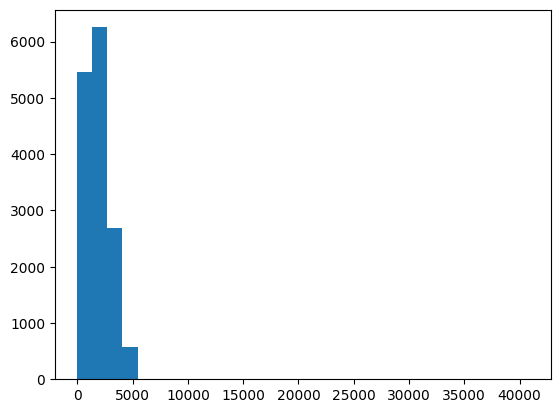

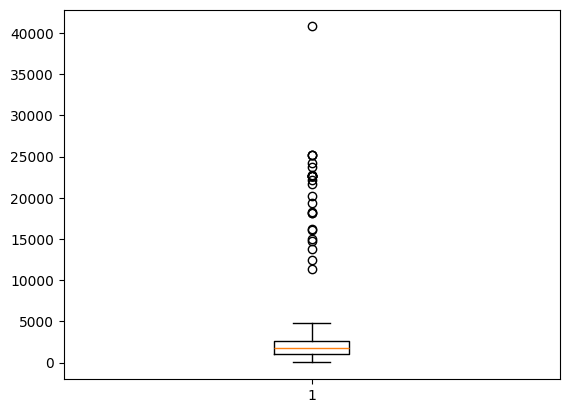

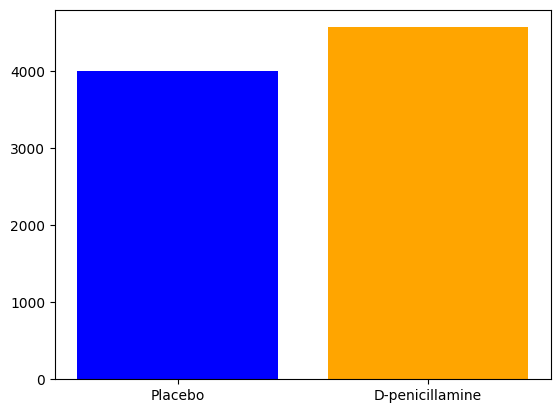

/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/3677733665.py:2: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[ 2990.    133.3   133.3 13727.  17874. ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  train_df.loc[train_df['N_Days'] > train_df['Age'], 'N_Days'] = train_df['Age']


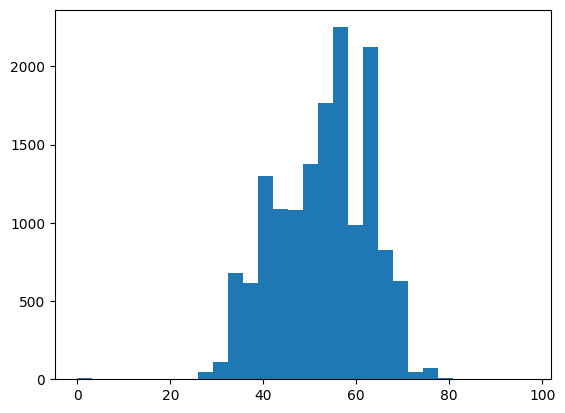

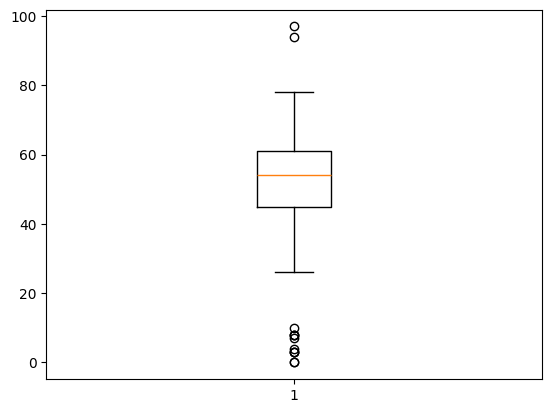

NA :  6437
Notnull :  8563
vide :  0


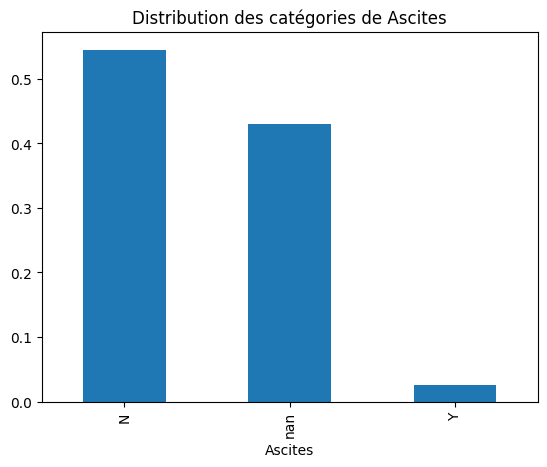

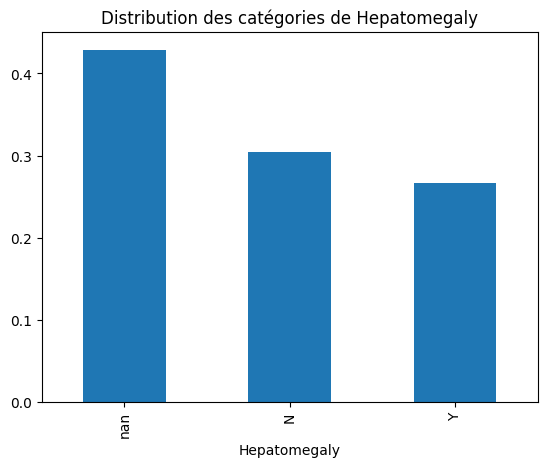

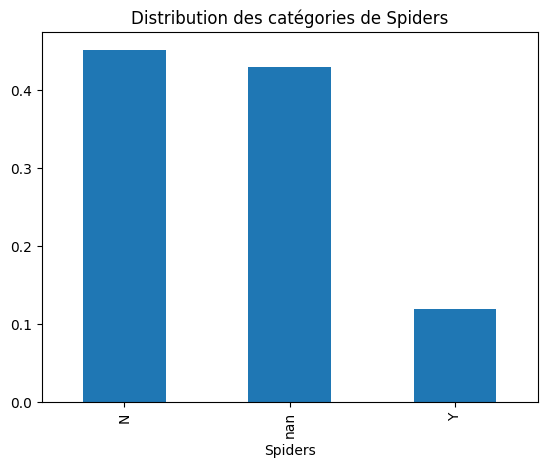

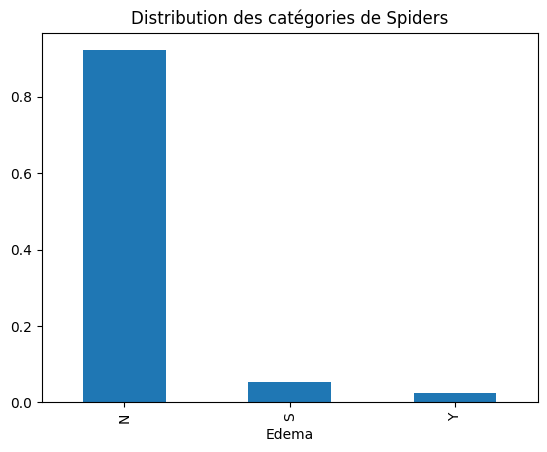

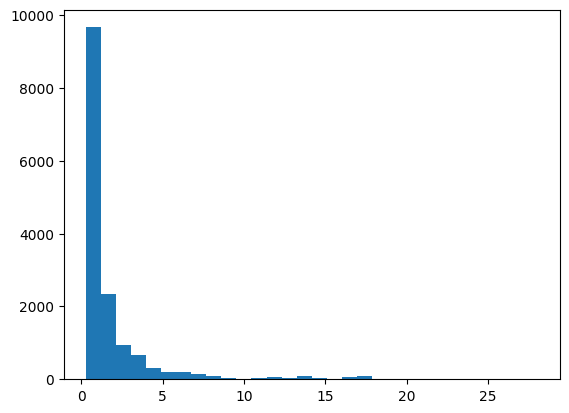

...

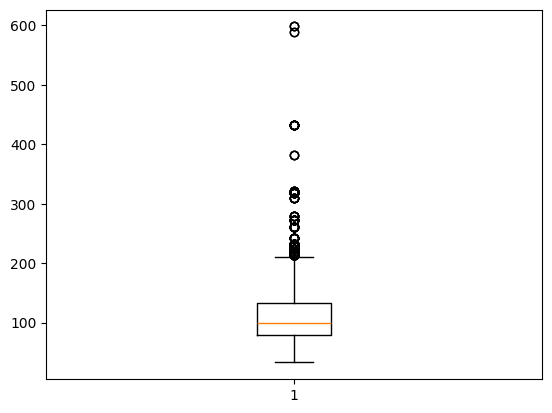

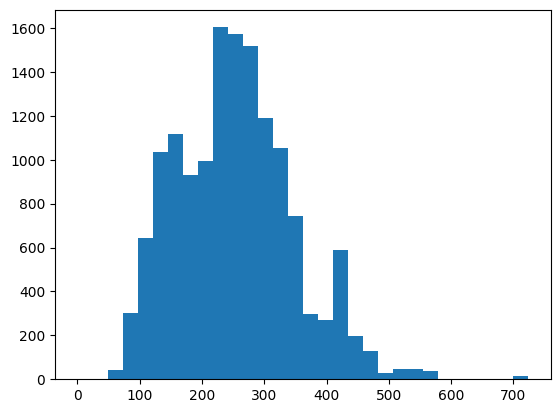

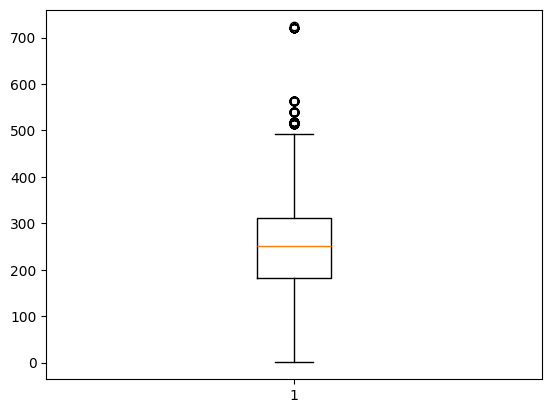

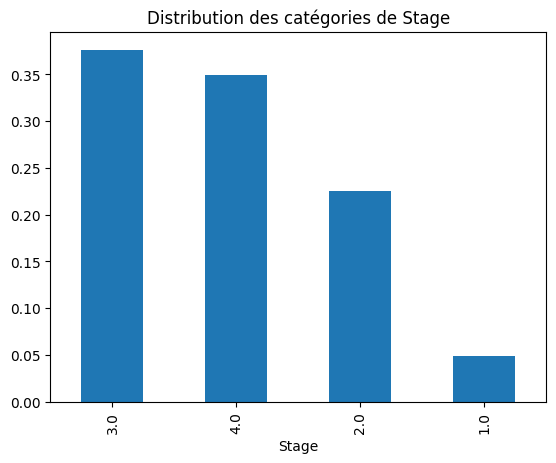

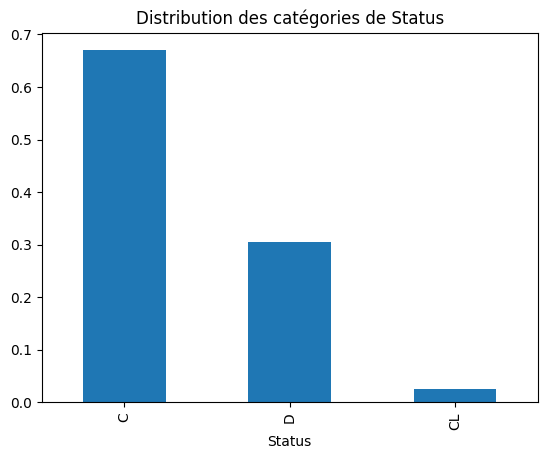

/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/3371030689.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=train_df, palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/3371030689.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=train_df, palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/3371030689.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=train_df, palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm000

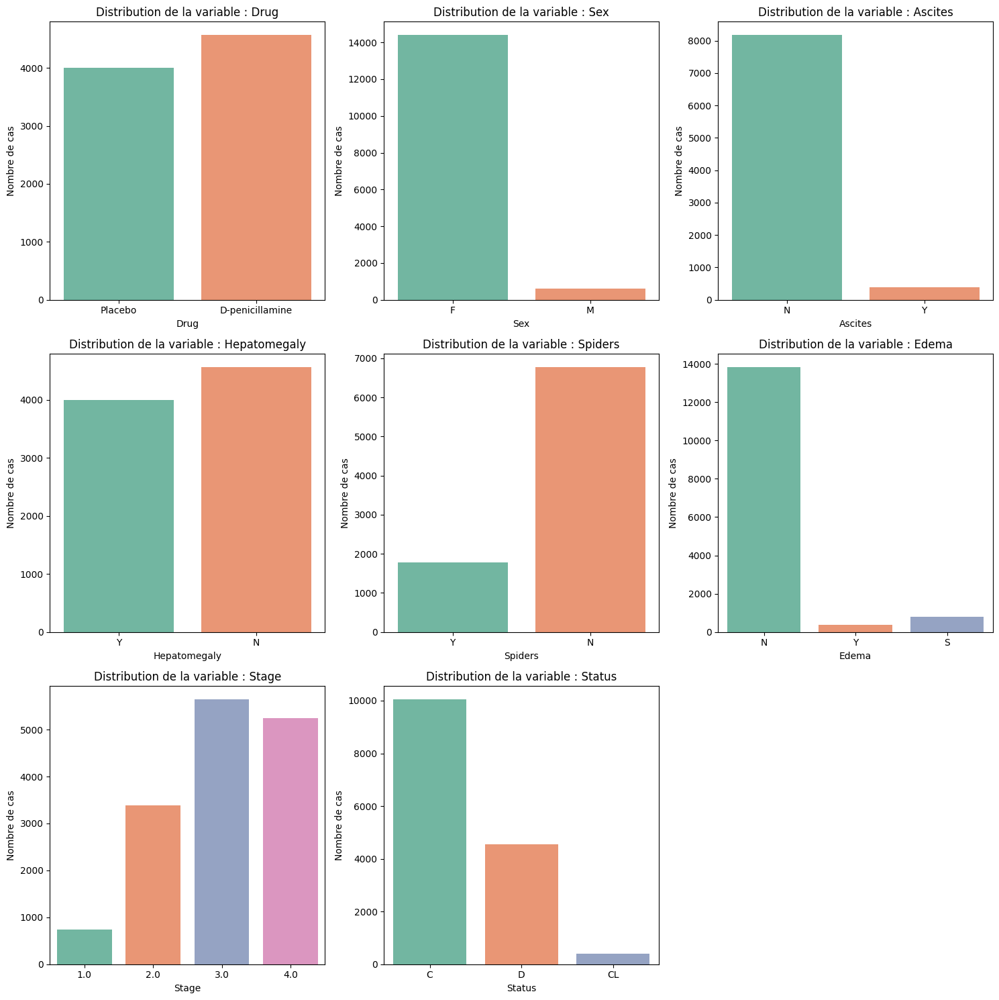

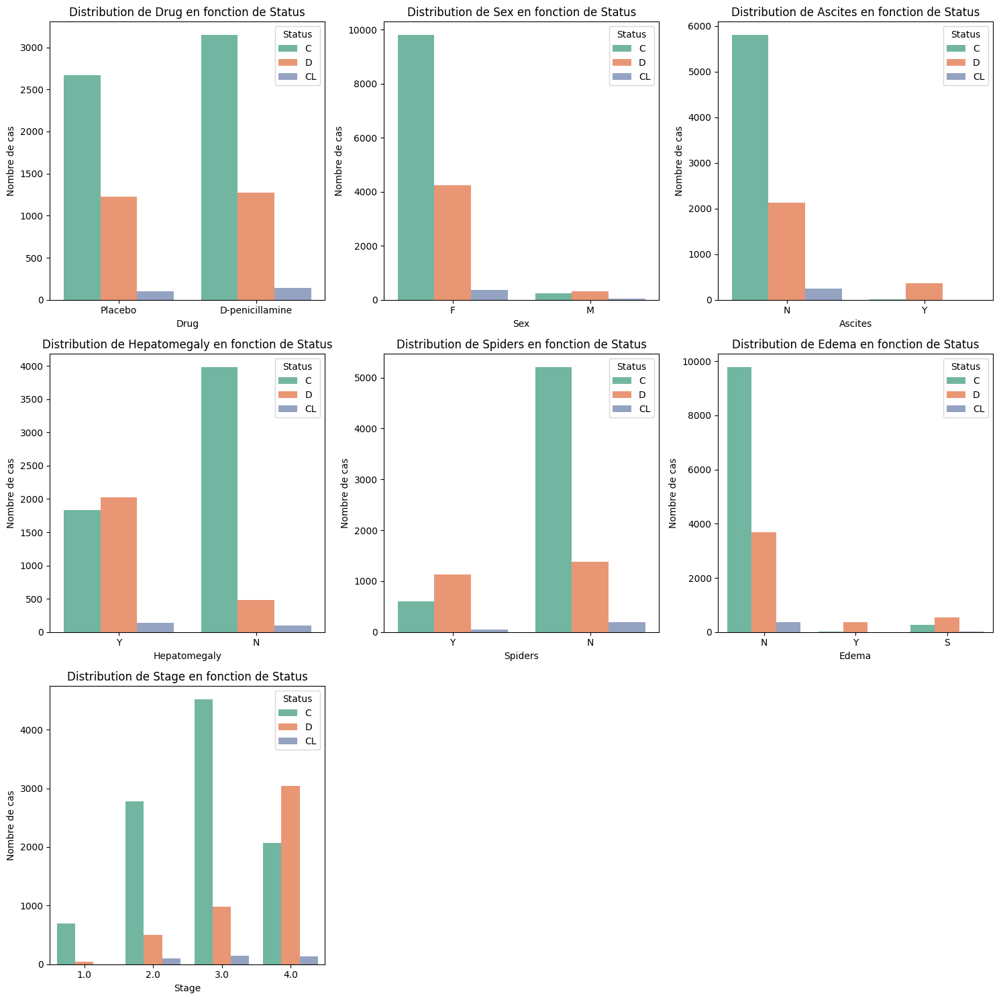

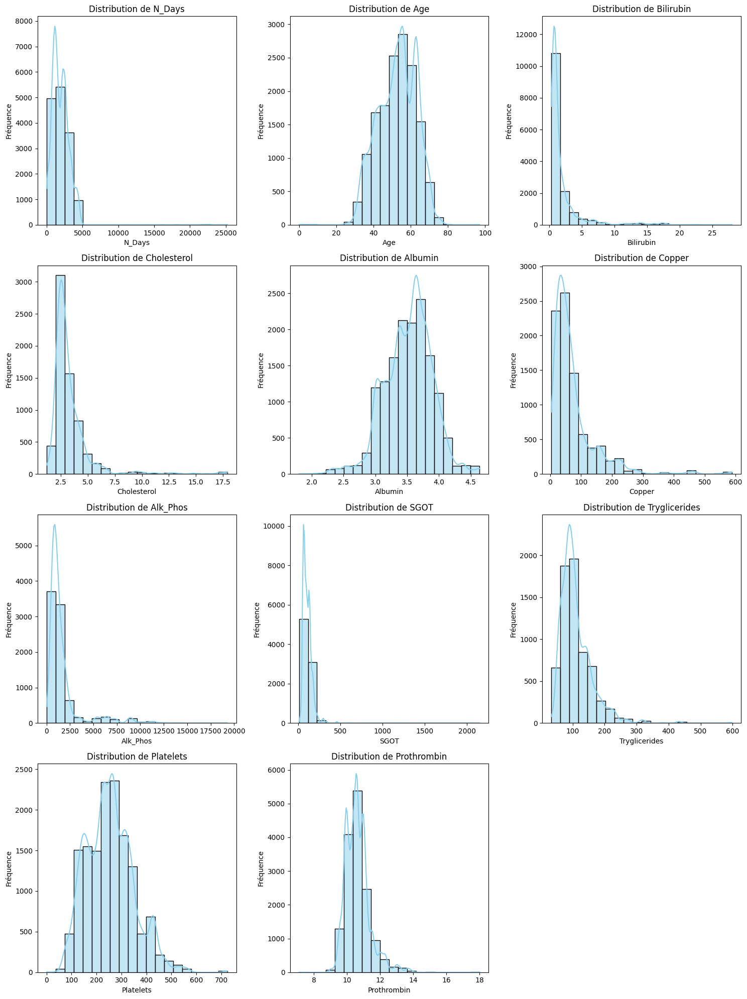

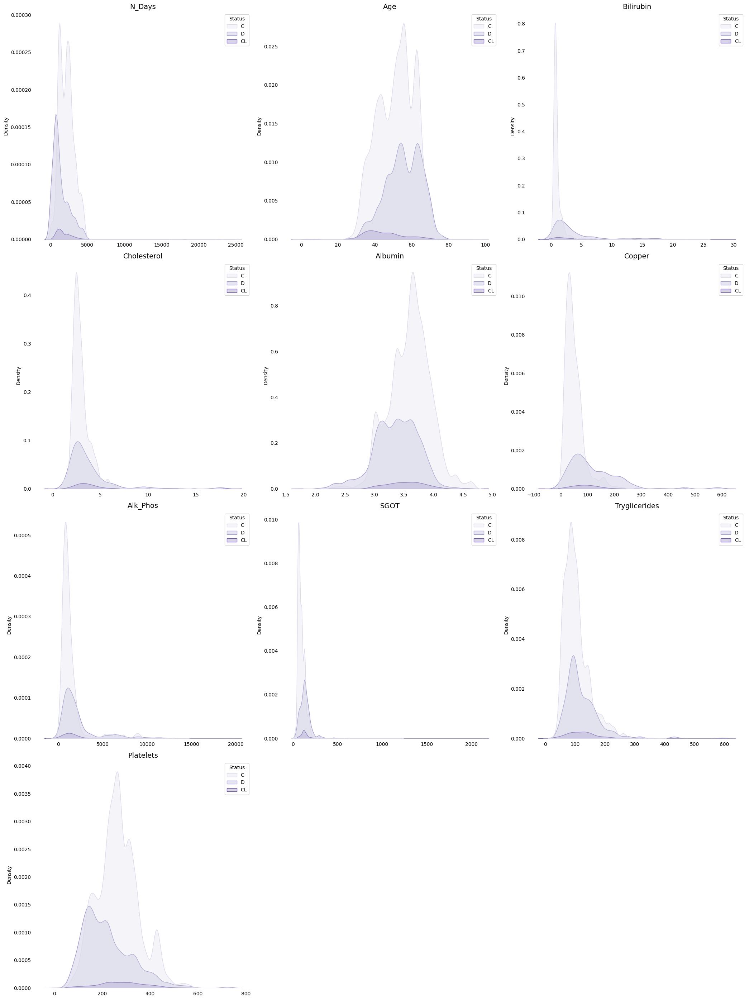

/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/350439153.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=train_df[col], palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/350439153.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=train_df[col], palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/350439153.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=train_df[col], palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/35

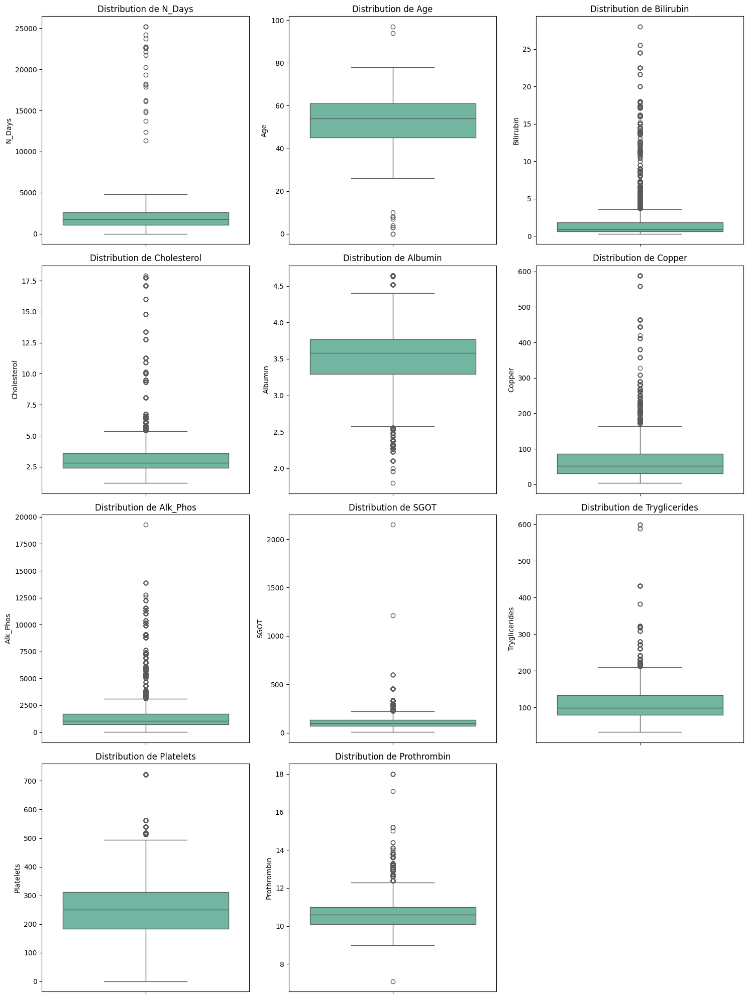

/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/4161465305.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Status', y=col, data=train_df, palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/4161465305.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Status', y=col, data=train_df, palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/4161465305.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Status', y=col, data=train_df, palette='Set2')
/var/folders/

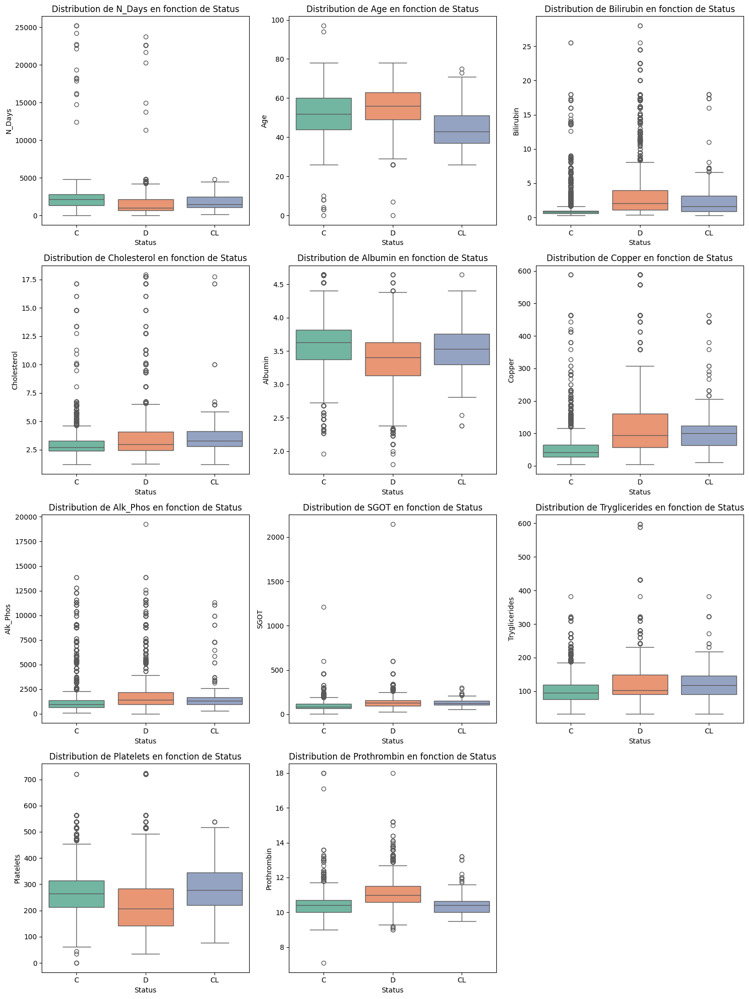

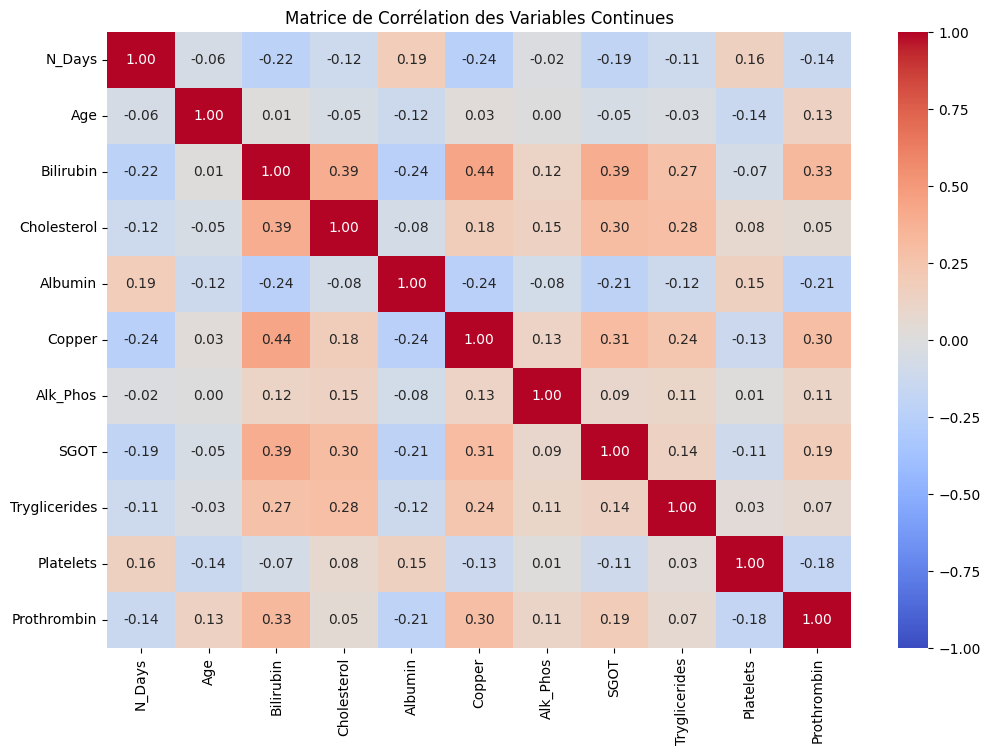

Statistique du chi-carré : 10.398610569958167
Valeur p : 0.005520398192462929
Tableau de contingence pour Drug et Status :
Status              C   CL     D
Drug                            
D-penicillamine  3147  144  1277
Placebo          2672   98  1226

--------------------------------------------------

Tableau de contingence pour Sex et Status :
Status     C   CL     D
Sex                    
F       9803  360  4240
M        246   31   320

--------------------------------------------------

Tableau de contingence pour Ascites et Status :
Status      C   CL     D
Ascites                 
N        5803  243  2132
Y          16    0   367

--------------------------------------------------

Tableau de contingence pour Hepatomegaly et Status :
Status           C   CL     D
Hepatomegaly                 
N             3981  103   480
Y             1834  140  2025

--------------------------------------------------

Tableau de contingence pour Spiders et Status :
Status      C   CL     D

In [30]:
%run EDA.ipynb

In [31]:
imputer_mean = SimpleImputer(strategy='mean')
imputer_median = SimpleImputer(strategy='median')
imputer_mode = SimpleImputer(strategy='most_frequent')

numerical_features = ["Bilirubin", "Cholesterol", "Albumin", "Copper", "Alk_Phos", "SGOT", "Tryglicerides", "Platelets", "Prothrombin"]
categorical_features = ["Drug", "Ascites", "Hepatomegaly", "Spiders", "Edema", "Sex"]

train_df[numerical_features] = imputer_median.fit_transform(train_df[numerical_features])
test_df[numerical_features] = imputer_median.transform(test_df[numerical_features])

for cat in categorical_features:
    train_df[cat].fillna(train_df[cat].mode()[0], inplace=True)
    test_df[cat].fillna(test_df[cat].mode()[0], inplace=True)

/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/623934923.py:13: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  train_df[cat].fillna(train_df[cat].mode()[0], inplace=True)
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/623934923.py:14: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting 

In [32]:
print(train_df.isna().sum())

id               0
N_Days           0
Drug             0
Age              0
Sex              0
Ascites          0
Hepatomegaly     0
Spiders          0
Edema            0
Bilirubin        0
Cholesterol      0
Albumin          0
Copper           0
Alk_Phos         0
SGOT             0
Tryglicerides    0
Platelets        0
Prothrombin      0
Stage            0
Status           0
dtype: int64


In [33]:
train_df.head()

,id,N_Days,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage,Status
0,0,1055.0,D-penicillamine,54,F,N,N,N,N,1.3,2.80,3.64,52.0,1072.0,97.65,99.0,209.0,10.5,3.0,C
1,1,3282.0,Placebo,49,F,N,Y,Y,N,0.7,3.09,3.60,96.0,1142.0,71.30,106.0,240.0,12.4,4.0,C
2,2,1653.0,D-penicillamine,56,F,N,N,N,N,2.2,2.80,3.64,52.0,1072.0,97.65,99.0,139.0,9.5,2.0,C
3,3,999.0,D-penicillamine,62,F,N,Y,N,N,1.0,4.98,3.35,89.0,1601.0,164.30,85.0,394.0,9.7,3.0,C
4,4,2202.0,D-penicillamine,49,F,N,N,N,N,17.2,2.80,3.15,52.0,1072.0,97.65,99.0,432.0,11.2,3.0,C


### <span style="color:blue">Méthode 3</span>

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             15000 non-null  int64  
 1   N_Days         15000 non-null  float64
 2   Drug           8564 non-null   object 
 3   Age            15000 non-null  float64
 4   Sex            15000 non-null  object 
 5   Ascites        8563 non-null   object 
 6   Hepatomegaly   8564 non-null   object 
 7   Spiders        8555 non-null   object 
 8   Edema          15000 non-null  object 
 9   Bilirubin      15000 non-null  float64
 10  Cholesterol    6669 non-null   float64
 11  Albumin        15000 non-null  float64
 12  Copper         8452 non-null   float64
 13  Alk_Phos       8558 non-null   float64
 14  SGOT           8555 non-null   float64
 15  Tryglicerides  6630 non-null   float64
 16  Platelets      14414 non-null  float64
 17  Prothrombin    14974 non-null  float64
 18  Stage 

/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/3677733665.py:2: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[ 2990.    133.3   133.3 13727.  17874. ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  train_df.loc[train_df['N_Days'] > train_df['Age'], 'N_Days'] = train_df['Age']
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/3371030689.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=train_df, palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/3371030689.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same eff

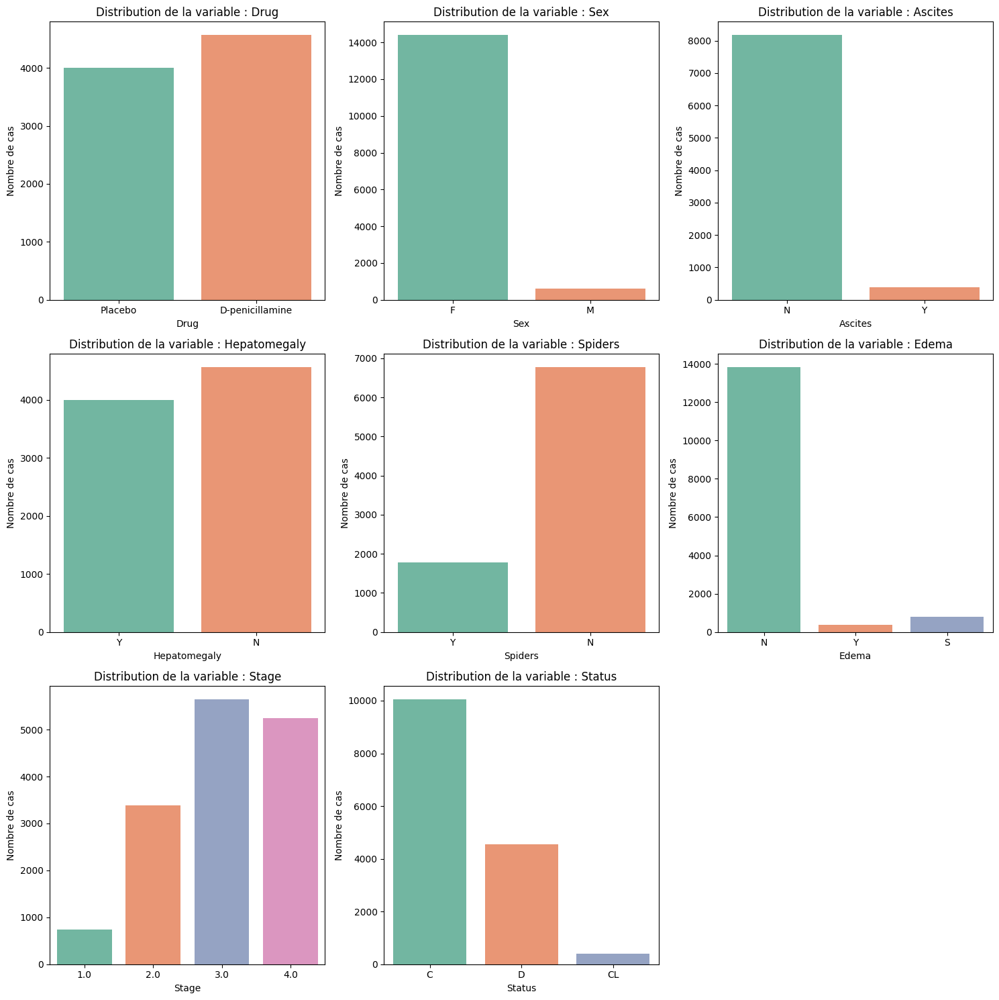

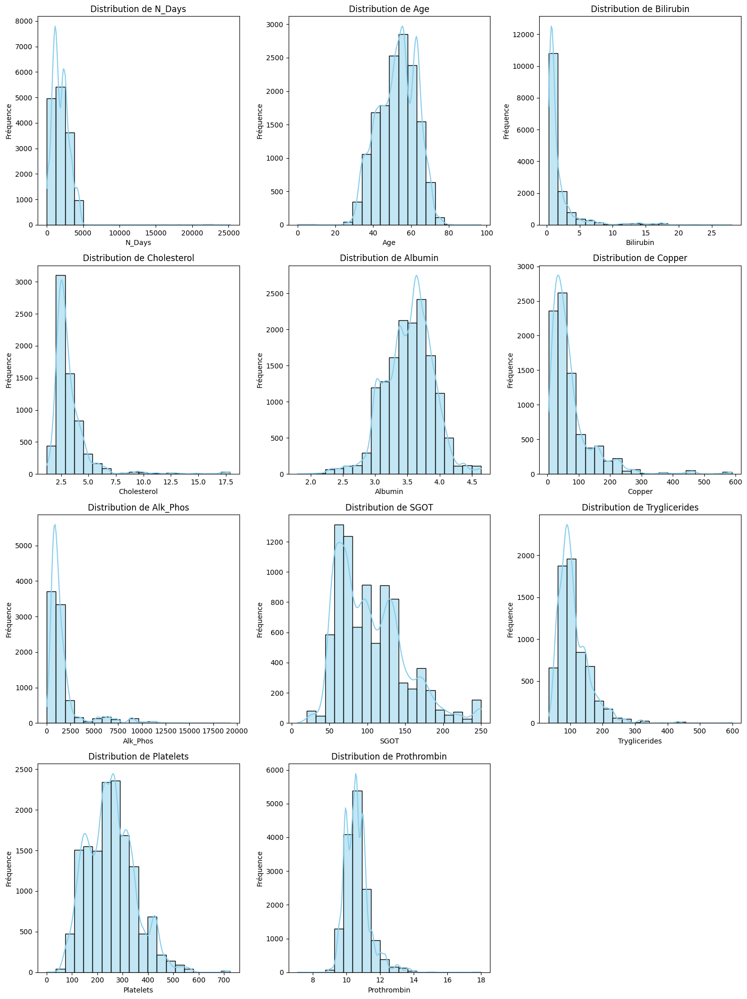

/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/350439153.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=train_df[col], palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/350439153.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=train_df[col], palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/350439153.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=train_df[col], palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/35

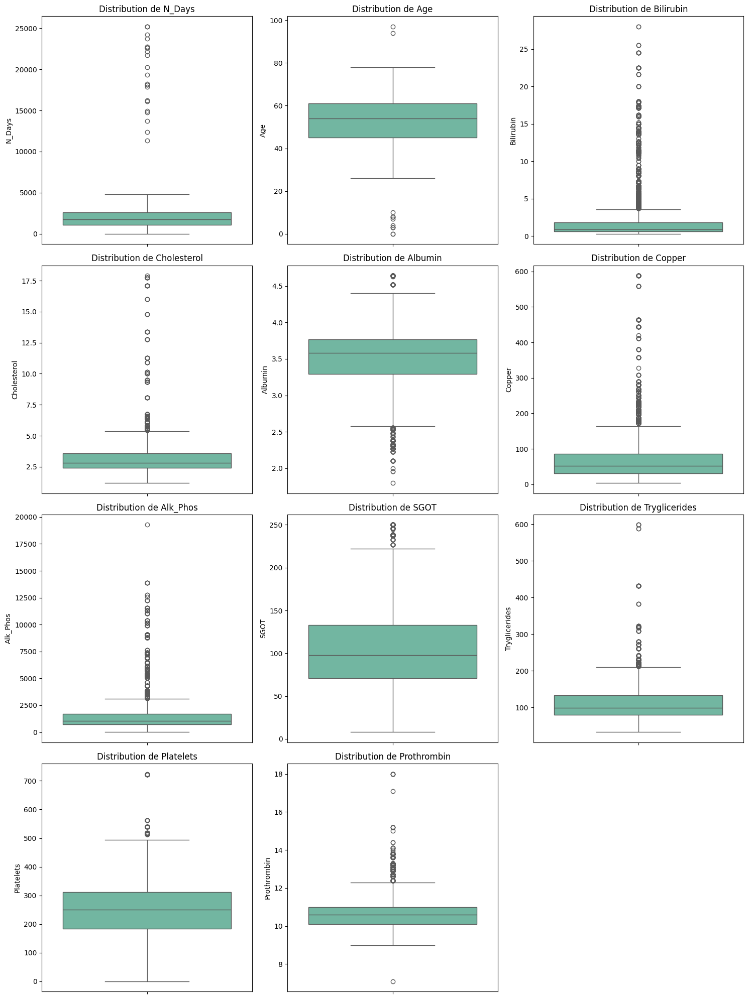

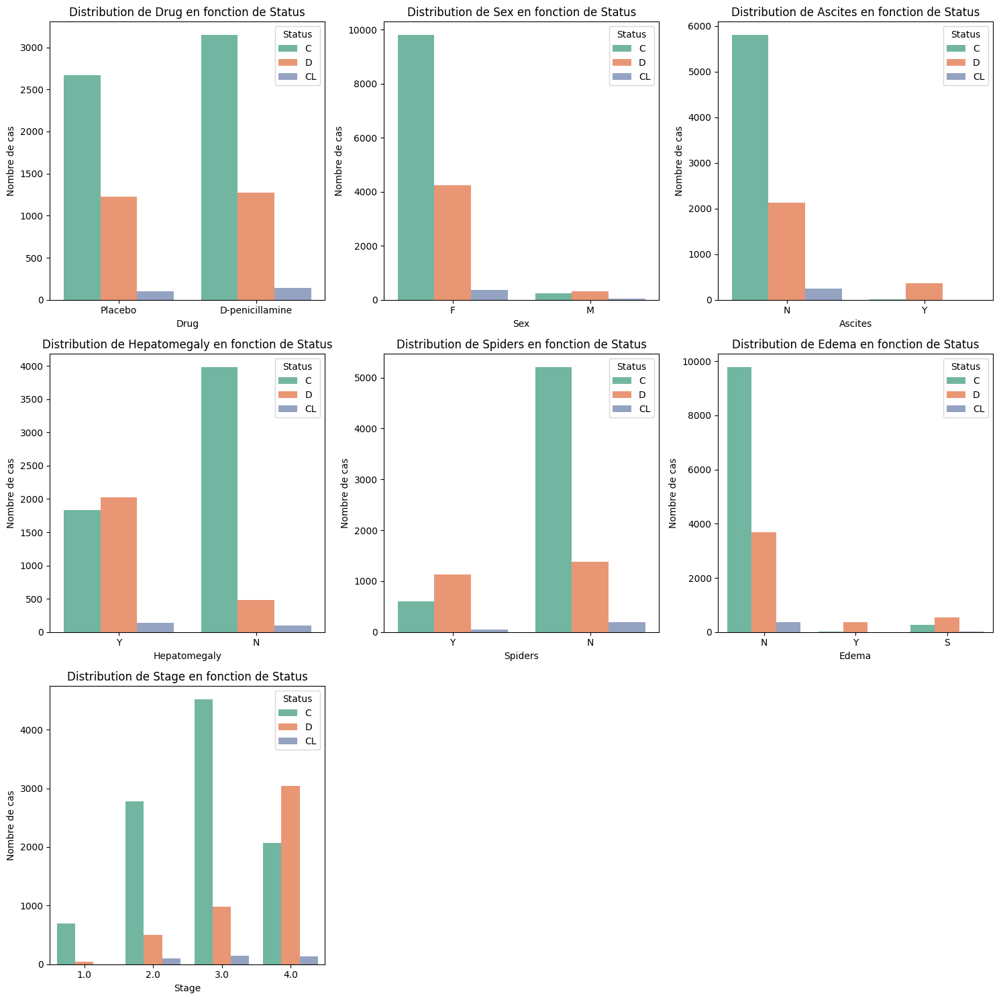

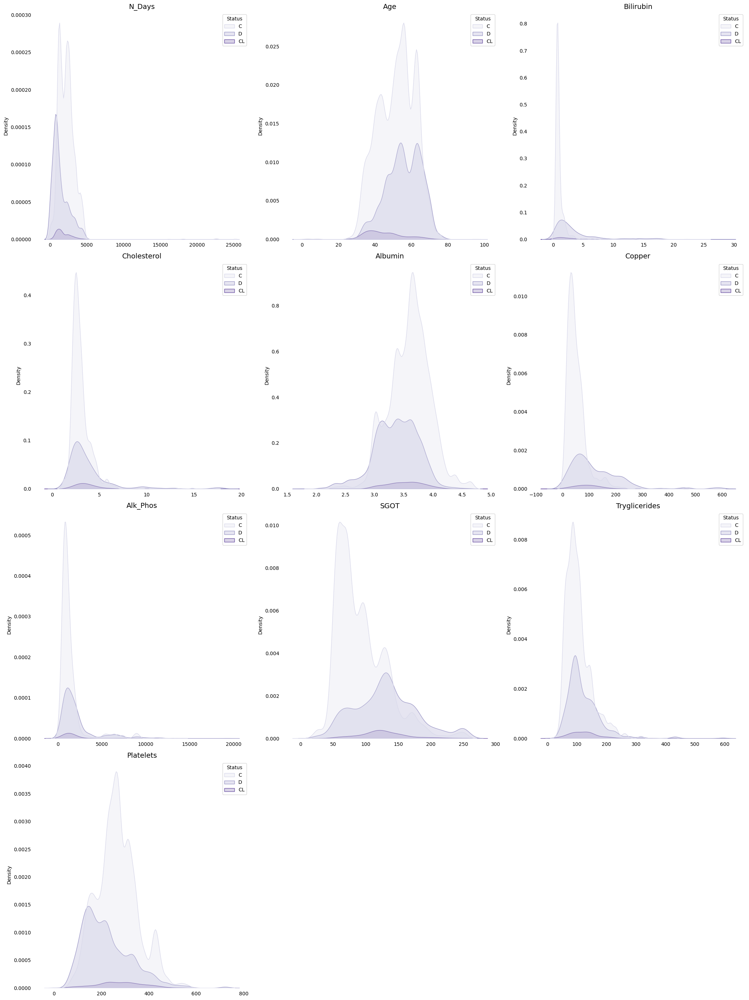

/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/4161465305.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Status', y=col, data=train_df, palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/4161465305.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Status', y=col, data=train_df, palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/4161465305.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Status', y=col, data=train_df, palette='Set2')
/var/folders/

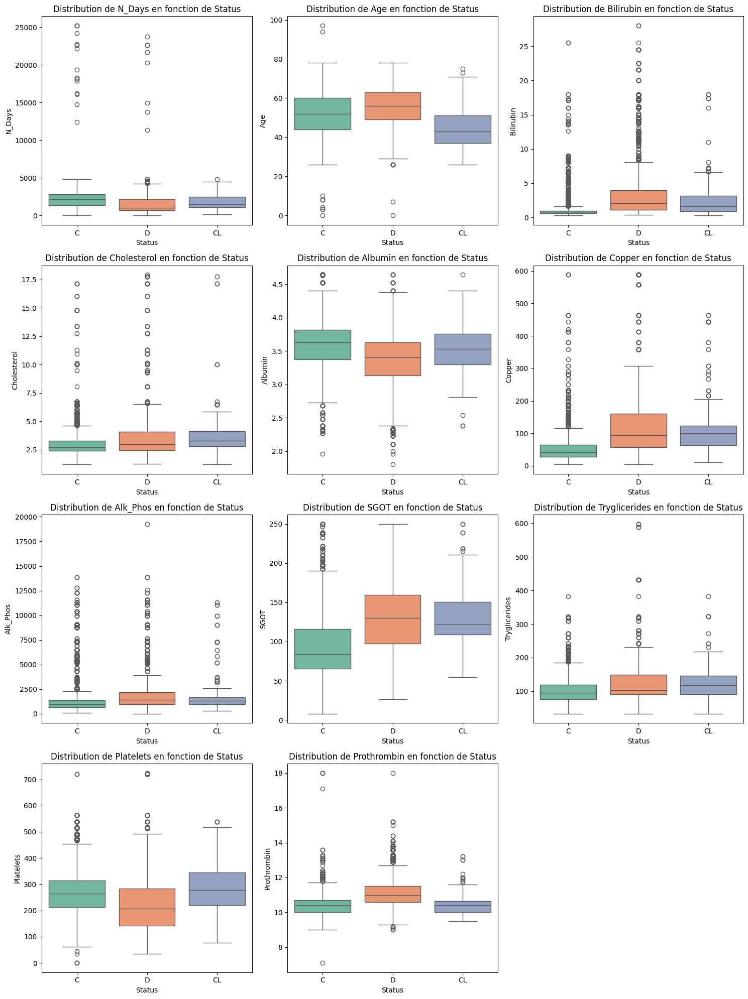

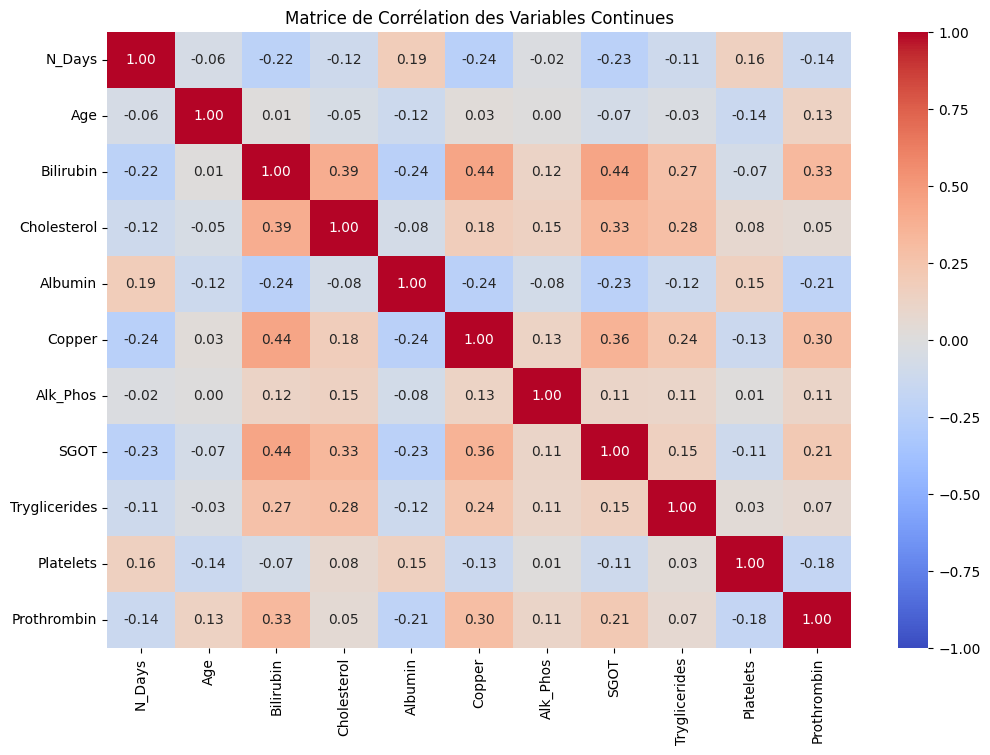

Variable : Drug
Statistique du chi-carré : 10.398610569958167
Valeur p : 0.005520398192462929


Variable : Sex
Statistique du chi-carré : 187.76010370560022
Valeur p : 1.6920434828805052e-41


Variable : Ascites
Statistique du chi-carré : 861.2489096270547
Valeur p : 9.597884113653021e-188


Variable : Hepatomegaly
Statistique du chi-carré : 1721.4629220345441
Valeur p : 0.0


Variable : Spiders
Statistique du chi-carré : 1261.8005479313981
Valeur p : 1.008073934491804e-274


Variable : Edema
Statistique du chi-carré : 1337.2522922055573
Valeur p : 2.7873191207540522e-288


Variable : Stage
Statistique du chi-carré : 2992.3917582734034
Valeur p : 0.0


N_Days: p-value test ANOVA = 0.0000
Age: p-value test ANOVA = 0.0000
Bilirubin: p-value test ANOVA = 0.0000
Cholesterol: p-value test ANOVA = 0.0000
Albumin: p-value test ANOVA = 0.0000
Copper: p-value test ANOVA = 0.0000
Alk_Phos: p-value test ANOVA = 0.0000
SGOT: p-value test ANOVA = 0.0000
Tryglicerides: p-value test ANOVA = 0.0000
Pl

In [130]:
%run EDA.ipynb

In [ ]:
# Créer une variable binaire pour les individus appartenant au groupe des non-répondants

In [131]:
# 1) Créer des colonnes indicatrices de valeurs manquantes
for col in train_df.columns:
    if train_df[col].isnull().sum() > 0:
        train_df[f"{col}_missing"] = train_df[col].isnull().astype(int)

In [ ]:
# 2) Appliquer KNN Imputer pour remplir les valeurs manquantes restantes
num_cols = train_df.select_dtypes(include=["int64", "float64"]).columns
cat_cols = train_df.select_dtypes(include=["object"]).columns

imputer = KNNImputer(n_neighbors=5) 
train_df[num_cols] = imputer.fit_transform(train_df[num_cols])

for col in cat_cols:
    train_df[col].fillna(train_df[col].mode()[0], inplace=True)

/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_34085/1550266999.py:9: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  train_df[col].fillna(train_df[col].mode()[0], inplace=True)


In [133]:
train_df.head()

,id,N_Days,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,...,Ascites_missing,Hepatomegaly_missing,Spiders_missing,Cholesterol_missing,Copper_missing,Alk_Phos_missing,SGOT_missing,Tryglicerides_missing,Platelets_missing,Prothrombin_missing
0,0.0,1055.0,D-penicillamine,54.0,F,N,N,N,N,1.3,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0
1,1.0,3282.0,Placebo,49.0,F,N,Y,Y,N,0.7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2.0,1653.0,D-penicillamine,56.0,F,N,N,N,N,2.2,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0
3,3.0,999.0,D-penicillamine,62.0,F,N,Y,N,N,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4.0,2202.0,D-penicillamine,49.0,F,N,N,N,N,17.2,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0


In [134]:
train_df.isna().sum()

id                       0
N_Days                   0
Drug                     0
Age                      0
Sex                      0
Ascites                  0
Hepatomegaly             0
Spiders                  0
Edema                    0
Bilirubin                0
Cholesterol              0
Albumin                  0
Copper                   0
Alk_Phos                 0
SGOT                     0
Tryglicerides            0
Platelets                0
Prothrombin              0
Stage                    0
Status                   0
Drug_missing             0
Ascites_missing          0
Hepatomegaly_missing     0
Spiders_missing          0
Cholesterol_missing      0
Copper_missing           0
Alk_Phos_missing         0
SGOT_missing             0
Tryglicerides_missing    0
Platelets_missing        0
Prothrombin_missing      0
dtype: int64

## <span style="color:red">Normalisation/Standardisation</span>

In [ ]:
# Définition des colonnes
categorical_cols = ['Drug', 'Sex', 'Ascites', 'Hepatomegaly', 'Spiders', 'Edema'] # Non ordinales
ordinal_cols = ["Stage"]  # Ordinale
numeric_cols= ['N_Days', 'Age', 'Bilirubin', 'Cholesterol', 'Albumin', 'Copper',
       'Alk_Phos', 'SGOT', 'Tryglicerides', 'Platelets', 'Prothrombin']

### <span style="color:blue">Méthode Normalisation (MinMaxScaler)</span>

> - La normalisation utilise le MinMaxScaler pour transformer les données afin qu'elles se situent dans une plage spécifique, généralement entre 0 et 1.
> - Elle s'appuie sur le minimum et le maximum des données, ce qui peut poser problème dans notre cas en présence de nombreuses valeurs extrêmes, car celles-ci peuvent influencer de manière disproportionnée la plage de normalisation.

In [ ]:
# Normalisation (entre 0 et 1)
scaler_minmax = MinMaxScaler()
train_df_normalized = train_df.copy()
train_df_normalized[numeric_cols] = scaler_minmax.fit_transform(train_df_normalized[numeric_cols])

In [66]:
train_df_standard.head()

,id,N_Days,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage,Status
0,0,-0.686989,1,54,F,0,0,0,N,-0.203999,0.859078,0.309988,0.206018,0.794540,0.537547,-0.089758,-0.480444,-0.172326,2,C
1,1,0.994078,2,49,F,1,2,2,N,-0.421999,-0.114734,0.201871,0.299861,-0.321514,-0.748156,-0.094961,-0.146601,2.390313,3,C
2,2,-0.235584,1,56,F,0,0,0,N,0.123003,1.683407,0.309988,0.118432,-0.114966,0.225221,-0.391534,-1.234282,-1.521084,1,C
3,3,-0.729261,0,62,F,1,2,1,N,-0.312999,1.256730,-0.473861,0.190378,-0.013504,1.238327,-0.641280,1.511843,-1.251332,2,C
4,4,0.178832,1,49,F,0,0,0,N,5.573023,-0.489165,-1.014447,0.002693,0.150230,0.063952,-0.448768,1.921070,0.771804,2,C


In [41]:
train_df_normalized.head()

,id,N_Days,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage,Status
0,0,0.041748,1,54,F,0,0,0,N,0.036101,0.193533,0.647887,0.147260,0.144861,0.057707,0.129558,0.288281,0.311927,2,C
1,1,0.130124,2,49,F,1,2,2,N,0.014440,0.113174,0.633803,0.157534,0.058481,0.029579,0.129204,0.331122,0.486239,3,C
2,2,0.065479,1,56,F,0,0,0,N,0.068592,0.261557,0.647887,0.137671,0.074468,0.050874,0.109027,0.191542,0.220183,1,C
3,3,0.039525,0,62,F,1,2,1,N,0.025271,0.226347,0.545775,0.145548,0.082321,0.073037,0.092035,0.543947,0.238532,2,C
4,4,0.087265,1,49,F,0,0,0,N,0.610108,0.082275,0.475352,0.125000,0.094993,0.047346,0.105133,0.596462,0.376147,2,C


### <span style="color:blue">Méthode Standardisation (StandardScaler)</span>

> - La standardisation utilise le StandardScaler pour transformer les données de manière à ce qu'elles aient une moyenne de 0 et un écart-type de 1.
> - Cette méthode est efficace lorsque les données suivent une distribution normale et ne contiennent pas de valeurs aberrantes -> ce qui n'est pas notre cas ici.


In [ ]:
scaler_standard = StandardScaler()
train_df_standard = train_df.copy()
train_df_standard[numeric_cols] = scaler_standard.fit_transform(train_df_standard[numeric_cols])


### <span style="color:blue">Méthode RobustScaler</span>

> - Le RobustScaler est particulièrement adapté pour les données contenant des valeurs aberrantes .
> - Il utilise les percentiles des données (par défaut, le 1er et le 3e quartile) pour l'échelle, ce qui le rend moins sensible aux valeurs extrêmes par rapport au MinMaxScaler.
> - Cette approche est plus robuste et peut mieux préserver la structure des données en présence de valeurs aberrantes, ce qui en fait un choix potentiellement plus adapté dans notre cas.

In [7]:
scaler = RobustScaler()
X_train[numeric_cols]= scaler.fit_transform(X_train [numeric_cols])

NameError: name 'RobustScaler' is not defined

### <span style="color:blue">Autre méthode : tout standardiser sauf les variables age et N_days</span>

In [225]:
numeric_cols[2:]

['Bilirubin',
 'Cholesterol',
 'Albumin',
 'Copper',
 'Alk_Phos',
 'SGOT',
 'Tryglicerides',
 'Platelets',
 'Prothrombin']

In [ ]:
# tout standardiser sauf les variables age et N_days
from sklearn.preprocessing import RobustScaler

scaler = RobustScaler()
X_train[numeric_cols[2:]]= scaler.fit_transform(X_train [numeric_cols[2:]])

## <span style="color:red">Encodage des variables catégoriques</span>

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             15000 non-null  int64  
 1   N_Days         15000 non-null  float64
 2   Drug           8564 non-null   object 
 3   Age            15000 non-null  float64
 4   Sex            15000 non-null  object 
 5   Ascites        8563 non-null   object 
 6   Hepatomegaly   8564 non-null   object 
 7   Spiders        8555 non-null   object 
 8   Edema          15000 non-null  object 
 9   Bilirubin      15000 non-null  float64
 10  Cholesterol    6669 non-null   float64
 11  Albumin        15000 non-null  float64
 12  Copper         8452 non-null   float64
 13  Alk_Phos       8558 non-null   float64
 14  SGOT           8555 non-null   float64
 15  Tryglicerides  6630 non-null   float64
 16  Platelets      14414 non-null  float64
 17  Prothrombin    14974 non-null  float64
 18  Stage 

/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_44493/3677733665.py:2: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[ 2990.    133.3   133.3 13727.  17874. ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  train_df.loc[train_df['N_Days'] > train_df['Age'], 'N_Days'] = train_df['Age']
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_44493/3371030689.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=col, data=train_df, palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_44493/3371030689.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same eff

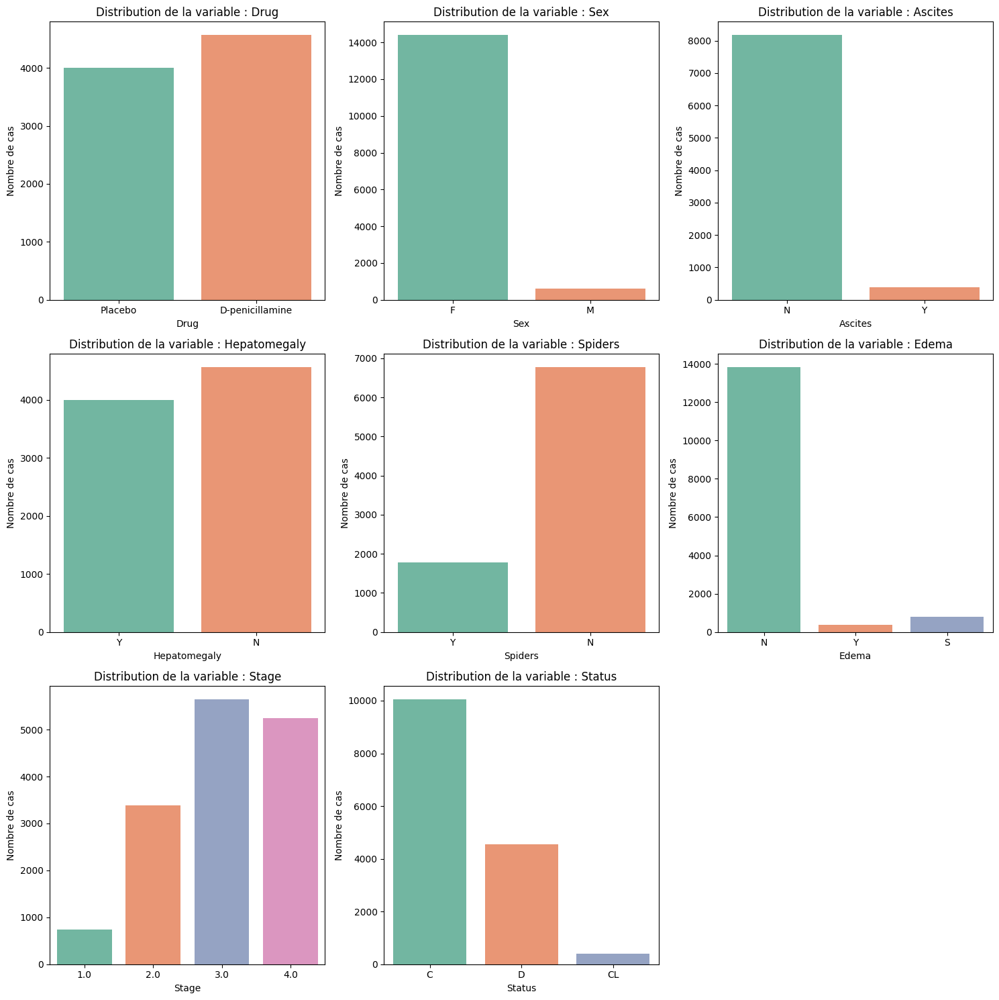

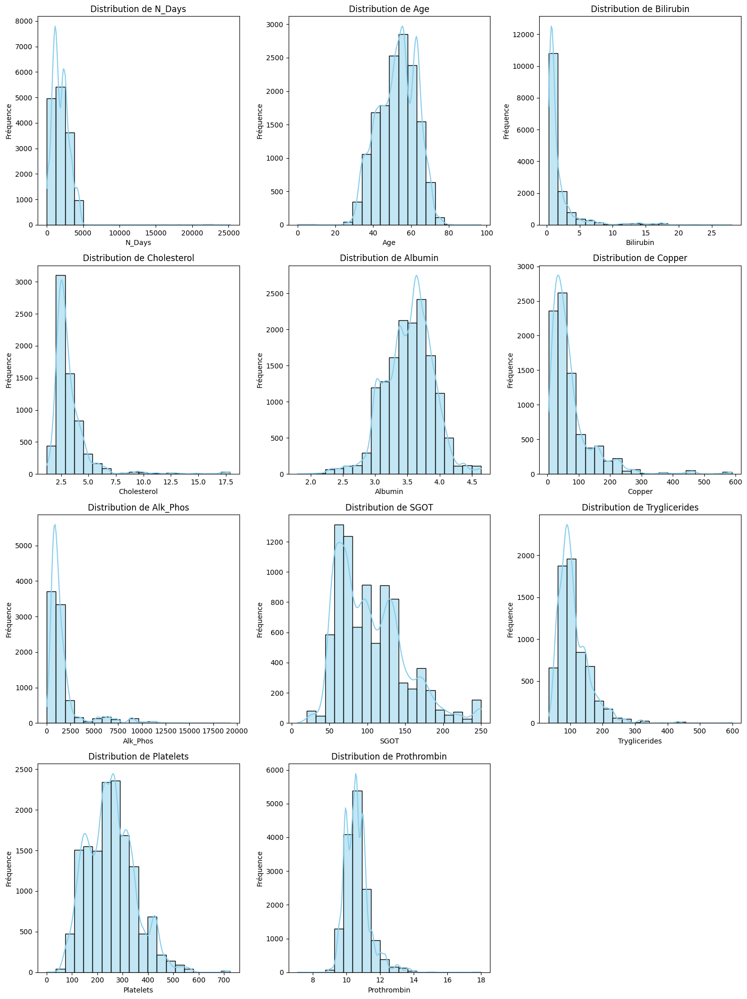

/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_44493/350439153.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=train_df[col], palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_44493/350439153.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=train_df[col], palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_44493/350439153.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y=train_df[col], palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_44493/35

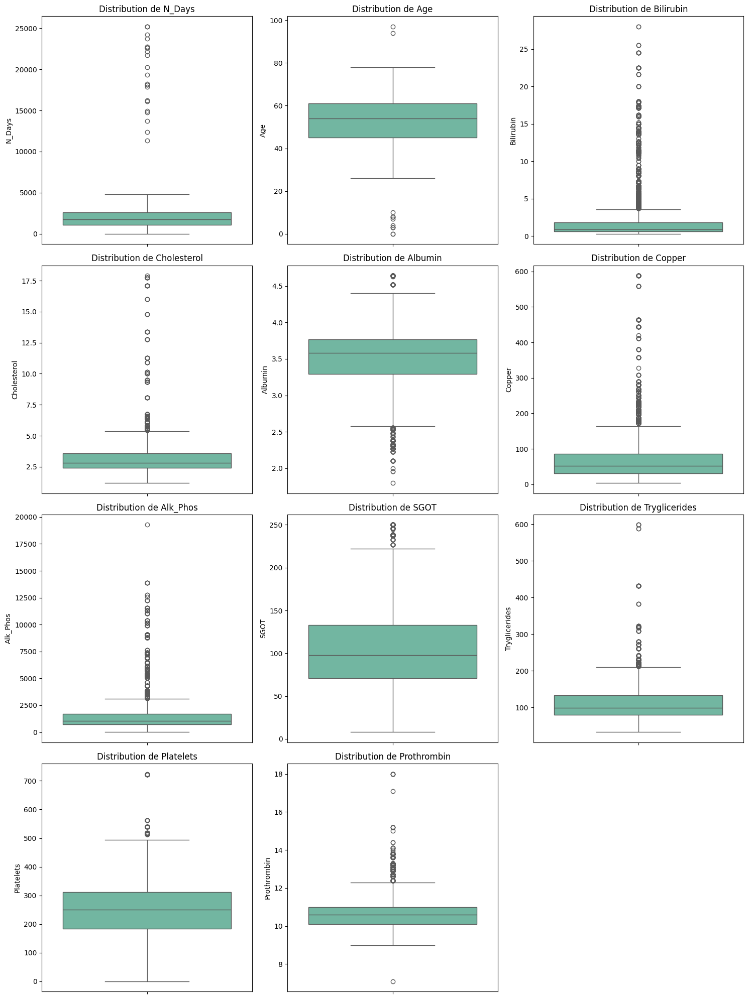

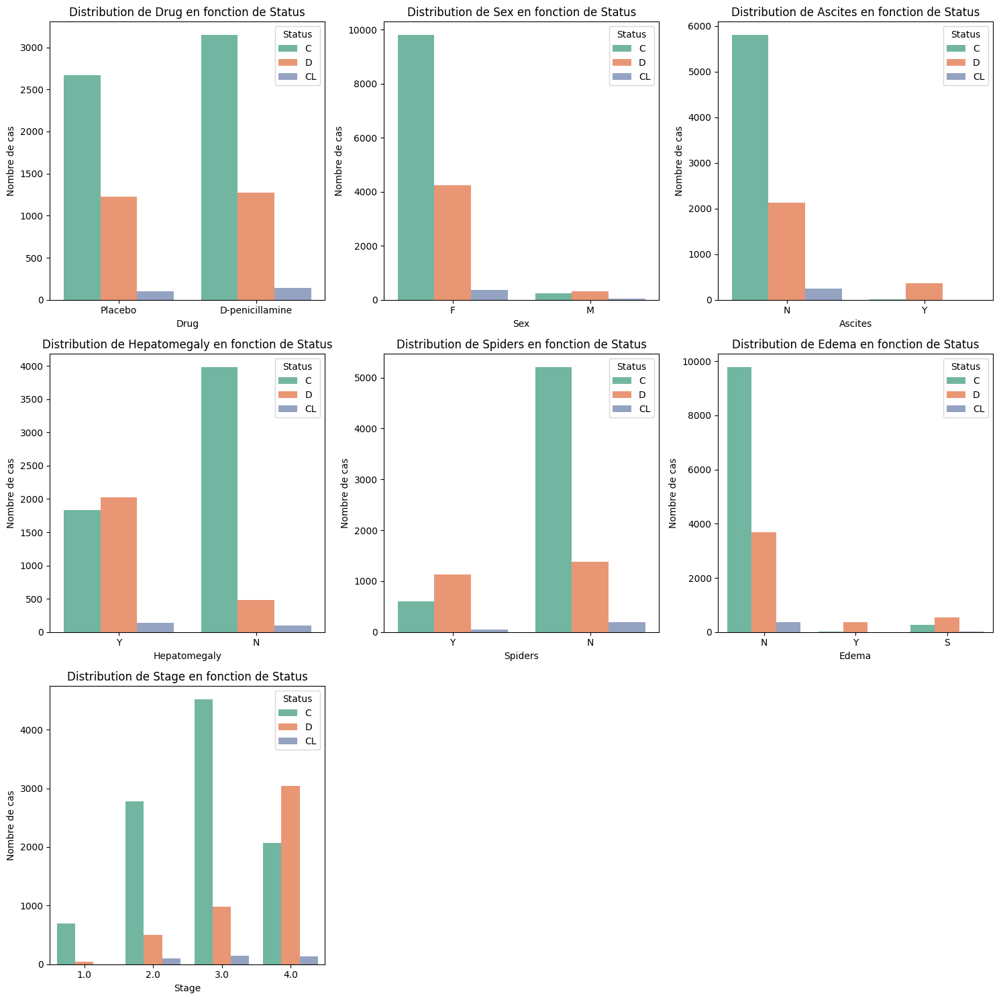

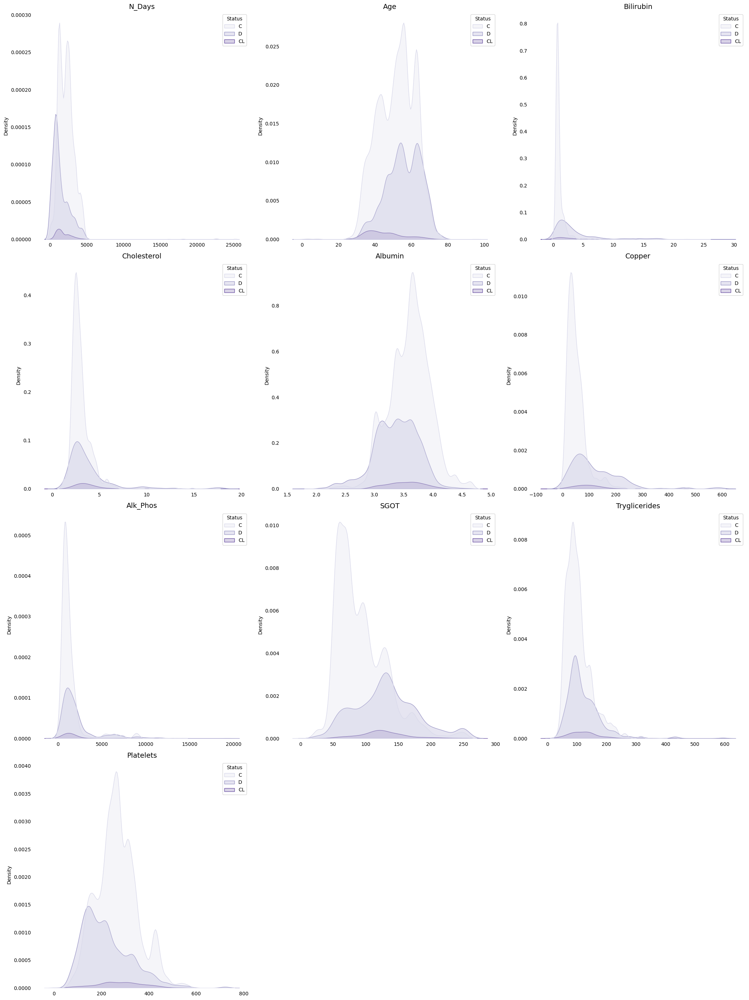

/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_44493/4161465305.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Status', y=col, data=train_df, palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_44493/4161465305.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Status', y=col, data=train_df, palette='Set2')
/var/folders/74/x3782kls1rv6qscx40xcj5rm0000gn/T/ipykernel_44493/4161465305.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Status', y=col, data=train_df, palette='Set2')
/var/folders/

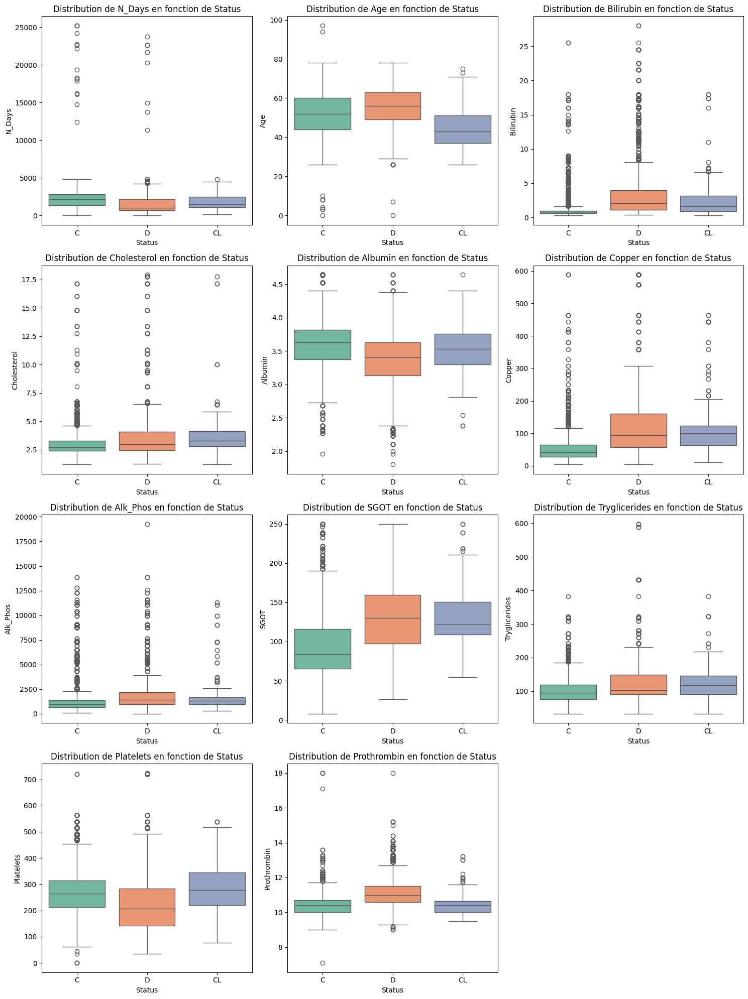

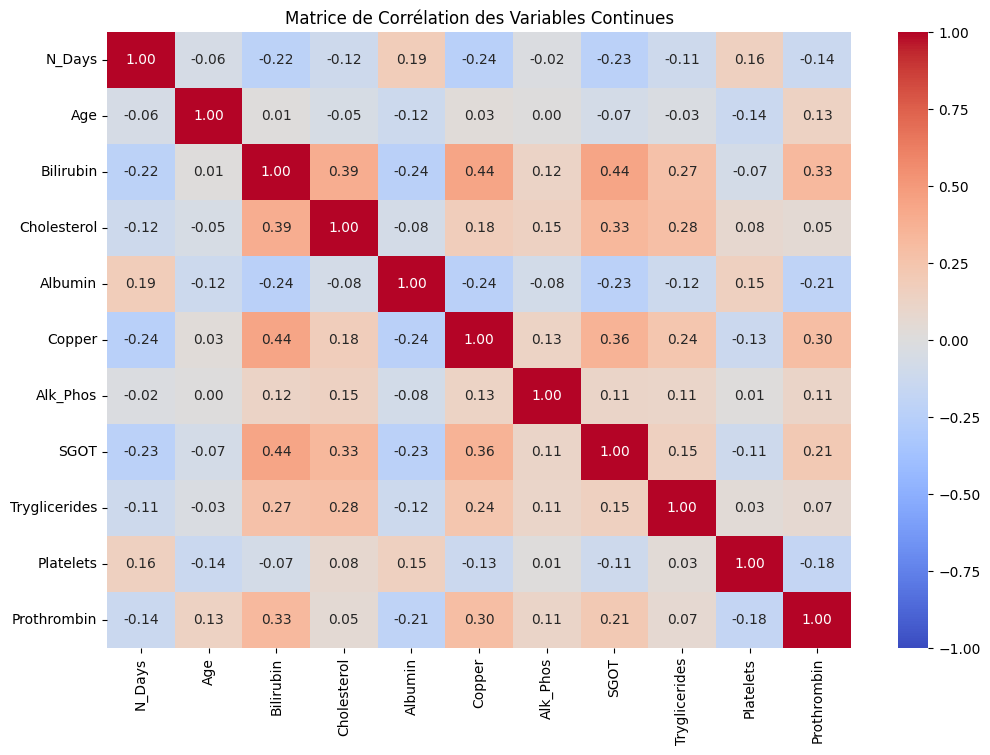

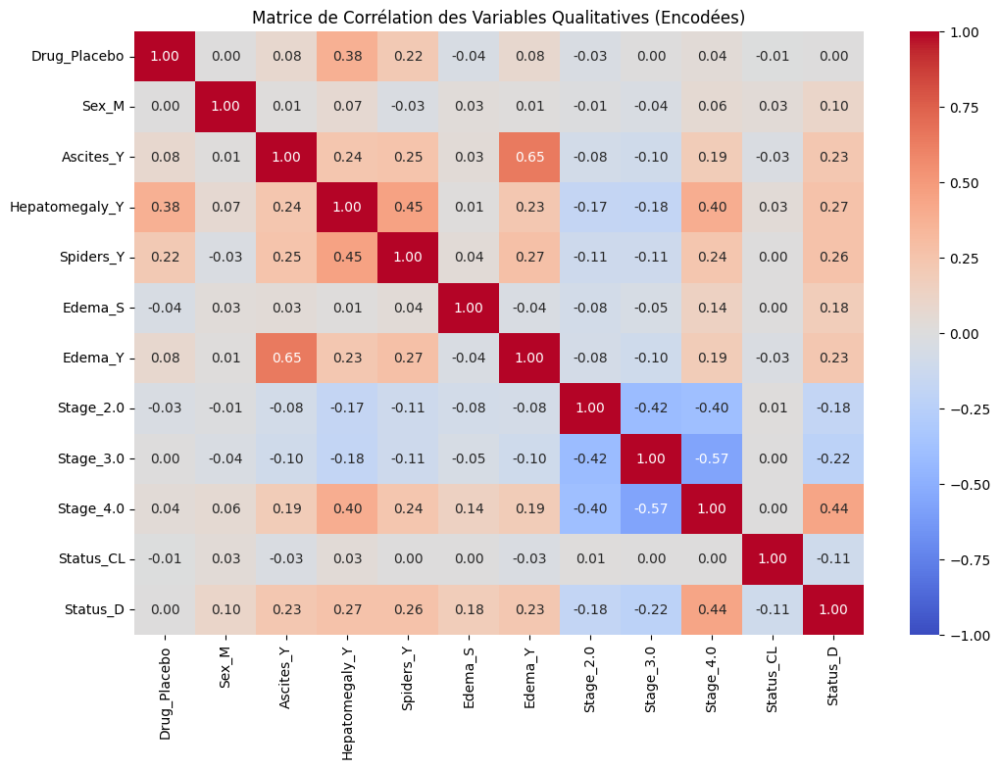

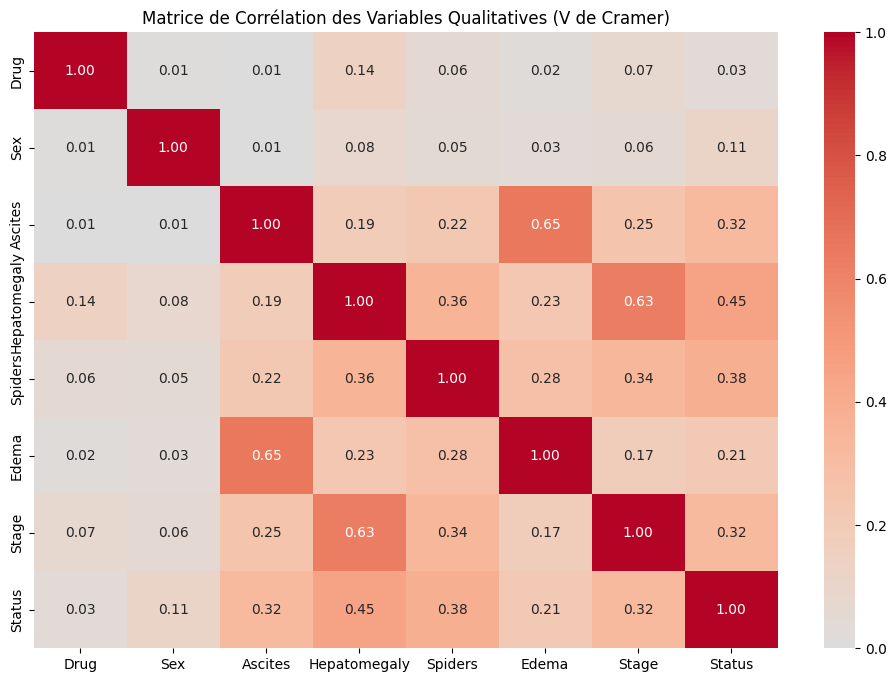

Variable : Drug
Statistique du chi-carré : 10.398610569958167
Valeur p : 0.005520398192462929


Variable : Sex
Statistique du chi-carré : 187.76010370560022
Valeur p : 1.6920434828805052e-41


Variable : Ascites
Statistique du chi-carré : 861.2489096270547
Valeur p : 9.597884113653021e-188


Variable : Hepatomegaly
Statistique du chi-carré : 1721.4629220345441
Valeur p : 0.0


Variable : Spiders
Statistique du chi-carré : 1261.8005479313981
Valeur p : 1.008073934491804e-274


Variable : Edema
Statistique du chi-carré : 1337.2522922055573
Valeur p : 2.7873191207540522e-288


Variable : Stage
Statistique du chi-carré : 2992.3917582734034
Valeur p : 0.0


N_Days: p-value test ANOVA = 0.0000
Age: p-value test ANOVA = 0.0000
Bilirubin: p-value test ANOVA = 0.0000
Cholesterol: p-value test ANOVA = 0.0000
Albumin: p-value test ANOVA = 0.0000
Copper: p-value test ANOVA = 0.0000
Alk_Phos: p-value test ANOVA = 0.0000
SGOT: p-value test ANOVA = 0.0000
Tryglicerides: p-value test ANOVA = 0.0000
Pl

In [40]:
%run EDA.ipynb

* Méthode 1 : Créer une colonne pour chaque modalité des variable catégorielles (Attention à la multi-colinéarité)

In [87]:
# one-hot encoding (pour les modèles linéaires ou réseaux neuronaux) :
categorical_cols = ["Drug", "Sex", "Ascites", "Hepatomegaly", "Spiders", "Stage"]
train_df_encoded_1 = pd.get_dummies(train_df, columns=categorical_cols, drop_first=True)

In [42]:
train_df_encoded_1.head()

,id,N_Days,Age,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,...,Prothrombin,Status,Drug_Placebo,Sex_M,Ascites_Y,Hepatomegaly_Y,Spiders_Y,Stage_2.0,Stage_3.0,Stage_4.0
0,0,1055.0,54,N,1.3,NaN,3.64,NaN,NaN,NaN,...,10.5,C,False,False,False,False,False,False,True,False
1,1,3282.0,49,N,0.7,3.09,3.60,96.0,1142.0,71.3,...,12.4,C,True,False,False,True,True,False,False,True
2,2,1653.0,56,N,2.2,NaN,3.64,NaN,NaN,NaN,...,9.5,C,False,False,False,False,False,True,False,False
3,3,999.0,62,N,1.0,4.98,3.35,89.0,1601.0,164.3,...,9.7,C,False,False,False,True,False,False,True,False
4,4,2202.0,49,N,17.2,NaN,3.15,NaN,NaN,NaN,...,11.2,C,False,False,False,False,False,False,True,False


* Méthode 2 : Chaque modalités des variables qualitatives est recodé par un chiffre (attention à l'ordre des chiffres)

In [35]:
# Label Encoding (Encodage des labels) :
var_categorielles = list(train_df.select_dtypes(include="object").columns)
# var_categorielles_1 = var_categorielles[:-1]
var_categorielles

['Drug',
 'Sex',
 'Ascites',
 'Hepatomegaly',
 'Spiders',
 'Edema',
 'Stage',
 'Status']

In [115]:
from sklearn.preprocessing import LabelEncoder
train_df_encoded_2 = train_df.copy()
# Appliquer le LabelEncoder sur chaque colonne catégorielle
label_encoders = {}
for col in var_categorielles:
    le = LabelEncoder()
    train_df_encoded_2[col] = le.fit_transform(train_df_encoded_2[col])
    label_encoders[col] = le  # Stocker le label encoder pour une utilisation future

# DataFrame après encodage
train_df_encoded_2.head()


,id,N_Days,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage,Status
0,0,1055.0,1,54,0,0,0,0,0,1.3,4.432,3.64,90.0,2805.16,131.492,106.2,209.0,10.5,2,0
1,1,3282.0,2,49,0,1,2,2,0,0.7,3.090,3.60,96.0,1142.00,71.300,106.0,240.0,12.4,3,0
2,2,1653.0,1,56,0,0,0,0,0,2.2,5.568,3.64,84.4,1449.80,116.870,94.6,139.0,9.5,1,0
3,3,999.0,0,62,0,1,2,1,0,1.0,4.980,3.35,89.0,1601.00,164.300,85.0,394.0,9.7,2,0
4,4,2202.0,1,49,0,0,0,0,0,17.2,2.574,3.15,77.0,1845.00,109.320,92.4,432.0,11.2,2,0


* Méthode 3 :

In [227]:
# Définition des colonnes
categorical_cols = ['Drug', 'Sex', 'Ascites', 'Hepatomegaly', 'Spiders', 'Edema'] # Non ordinales
ordinal_cols = ["Stage"]  # Ordinale
numeric_cols= ['N_Days', 'Age', 'Bilirubin', 'Cholesterol', 'Albumin', 'Copper',
       'Alk_Phos', 'SGOT', 'Tryglicerides', 'Platelets', 'Prothrombin']

In [ ]:
# Chaque modalités des variables qualitatives est recodé par un chiffre (attention à l'ordre des chiffres)

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Appliquer le LabelEncoder sur chaque colonne catégorielle
label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    train_df[col] = le.fit_transform(train_df[col])
    label_encoders[col] = le  # Stocker le label encoder pour une utilisation future

# DataFrame après encodage
train_df.head()


,id,N_Days,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage,Status
0,0,0.041748,1,0.556701,0,0,0,0,0,0.036101,0.173692,0.647887,0.175466,0.142275,0.453688,0.144789,0.288281,0.311927,3.0,C
1,1,0.130124,2,0.505155,0,1,2,2,0,0.014440,0.113174,0.633803,0.157534,0.058481,0.261570,0.129204,0.331122,0.486239,4.0,C
2,2,0.065479,1,0.577320,0,0,0,0,0,0.068592,0.128571,0.647887,0.096081,0.063997,0.399557,0.139053,0.191542,0.220183,2.0,C
3,3,0.039525,0,0.639175,0,1,2,1,0,0.025271,0.226347,0.545775,0.145548,0.082321,0.645868,0.092035,0.543947,0.238532,3.0,C
4,4,0.087265,1,0.505155,0,0,0,0,0,0.610108,0.105999,0.475352,0.064228,0.059831,0.309590,0.116732,0.596462,0.376147,3.0,C


In [ ]:
# Chaque modalités des variables qualitatives est recodé par un chiffre de manière ordonnée (ordinalencoder)

In [ ]:
print(train_df['Stage'].unique())  
train_df['Stage'] = train_df['Stage'].map({1.0: 0, 2.0: 1, 3.0: 2, 4.0: 3})
print(train_df['Stage'].unique())

[3.0 4.0 2.0 1.0]
[2 3 1 0]


In [ ]:
train_df['Status'] = train_df['Status'].map({'C': 0, 'CL': 1, 'D': 2})

In [ ]:
train_df.head()

,id,N_Days,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage,Status
0,0,0.041748,1,0.556701,0,0,0,0,0,0.036101,0.173692,0.647887,0.175466,0.142275,0.453688,0.144789,0.288281,0.311927,2,0
1,1,0.130124,2,0.505155,0,1,2,2,0,0.014440,0.113174,0.633803,0.157534,0.058481,0.261570,0.129204,0.331122,0.486239,3,0
2,2,0.065479,1,0.577320,0,0,0,0,0,0.068592,0.128571,0.647887,0.096081,0.063997,0.399557,0.139053,0.191542,0.220183,1,0
3,3,0.039525,0,0.639175,0,1,2,1,0,0.025271,0.226347,0.545775,0.145548,0.082321,0.645868,0.092035,0.543947,0.238532,2,0
4,4,0.087265,1,0.505155,0,0,0,0,0,0.610108,0.105999,0.475352,0.064228,0.059831,0.309590,0.116732,0.596462,0.376147,2,0
